<a href="https://colab.research.google.com/github/vivian-xia/NLP_MovieReviews/blob/main/Assignment_1_First_Vectorized_Representation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### Vivian Xia

## MSDS453 - Research Assignment 01 - First Vectorized Representation

### Importing Packages

In [1]:
import pandas as pd
import os
import numpy as np
import random 
import re
import string
from packaging import version

from numpy import array
from numpy import argmax

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot

import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize 
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk import ngrams, FreqDist

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.manifold import MDS
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, silhouette_score
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, KFold
from sklearn.manifold import TSNE

import gensim
from gensim.models import Word2Vec,LdaMulticore, TfidfModel
from gensim import corpora
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

In [2]:
import pkg_resources
pkg_resources.require("gensim<=3.8.3");

In [3]:
print("Genism Version: ", gensim.__version__)

Genism Version:  3.6.0


### NLTK Downloads

In [4]:
# Only run this once, they will be downloaded.
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [5]:
import warnings
warnings.filterwarnings('ignore')

### Mount Google Drive to Colab Environment

In [6]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


### Functions

In [7]:
def get_corpus(path_to_file):
    #read in class corpus csv into python
    data=pd.read_csv(path_to_file)

    #create empty list to store text documents titles
    titles=[]
    docids=[]
    #for loop which appends the DSI title to the titles list
    for i in range(0,len(data)):
        docids.append(data['Doc_ID'].iloc[i])

    #for loop which appends the DSI title to the titles list
    for i in range(0,len(data)):
        titles.append(data['DSI_Title'].iloc[i])

    #create empty list to store text documents
    text_body=[]

    #for loop which appends the text to the text_body list
    for i in range(0,len(data)):
        temp_text=data['Text'].iloc[i]
        text_body.append(temp_text)
    return (docids,titles,text_body)

def process_corpus(data):
        
    #create empty list to store text documents titles
    titles=[]
    
    #for loop which appends the DSI title to the titles list
    for i in range(0,len(data)):
        temp_text=data['DSI_Title'].iloc[i]
        titles.append(temp_text)
    
    #create empty list to store text documents
    text_body=[]
    
    #for loop which appends the text to the text_body list
    for i in range(0,len(data)):
        temp_text=data['Text'].iloc[i]
        text_body.append(temp_text)
    
    #Note: the text_body is the unprocessed list of documents read directly form 
    #the csv.
        
    #empty list to store processed documents
    processed_text=[]
    #for loop to process the text to the processed_text list
    for i in text_body:
        text=clean_doc(i) #apply the data wrangling function
        processed_text.append(text)
    
    #Note: the processed_text is the PROCESSED list of documents read directly form 
    #the csv.  Note the list of words is separated by commas.
    
    
    #stitch back together individual words to reform body of text
    final_processed_text=[]
    
    for i in processed_text:
        temp_DSI=i[0]
        for k in range(1,len(i)):
            temp_DSI=temp_DSI+' '+i[k]
        final_processed_text.append(temp_DSI)
    
    return titles, final_processed_text, processed_text

In [8]:
def remove_stop_words(in_text):
    stop_words = set(stopwords.words('english'))  #create list of stop words NLTK
    word_tokens = word_tokenize(in_text)  
    filtered_sentence = [w for w in word_tokens if not w in stop_words] 
    filtered_sentence = [] 
    for w in word_tokens: 
        if w not in stop_words: 
            filtered_sentence.append(w) 

    return filtered_sentence


def apply_stemming(in_text):
    stemmer = PorterStemmer()
    word_list = nltk.word_tokenize(in_text)
    output = ' '.join([stemmer.stem(w) for w in word_list])
    return output


def apply_lemmatization(in_text):
    # Lemmatization
    lem = WordNetLemmatizer()
    word_list = nltk.word_tokenize(in_text)
    output = ' '.join([lem.lemmatize(w) for w in word_list])
    return output

##Top term

In [9]:
#top 10 td-idf score terms
def top_term_scores():
  term=[]
  score=[]

  #import my 10 documents
  for doc in range(1,11): 
    path_to_docs='VXL_Doc{}_GuardiansOfTheGalaxy'.format(doc)
    data=pd.read_csv(path_to_docs)
    
    for i in data['term']:
        term.append(i)
    for i in data['score']:
        score.append(i)

  d = {'Term':term,'Score':score}
  term_score_df = pd.DataFrame(d) #dataframe with all the terms and scores from the 10 documents (so there are repeats)
  term_score_df = term_score_df[term_score_df['Score'] > 0] #tf-idf scores greater than 0

  for i in term_score_df['Term']:
    scores = []
    for index, term in enumerate(term_score_df['Term']):
      
      if(i==term):
        scores.append(term_score_df['Score'].iloc[index])
    
    #print(i)
    #print(scores)  
    mean_score = sum(scores)/len(scores) #calculate mean score of duplicated terms in the dataframe

    term_score_df = term_score_df[term_score_df['Term'] != i] #filter dataframe of the duplicated term
    df2 = {'Term': i, 'Score': mean_score}
    term_score_df = term_score_df.append(df2, ignore_index = True) #append the term and mean td-idf score
  
  term_score_df['Score'] = (term_score_df['Score']/10).round(2) #average score among the ten documents 
  term_score_df = term_score_df.sort_values(by=['Score'], ascending=False)
  
  return term_score_df

In [10]:
#functions to create and plot word2vec matrix
def run_word2vec(processed_text, dimension_size):

    #word to vec model
    model_w2v = Word2Vec(processed_text, size=dimension_size, window=3, min_count=2, workers=4)  #size=100,200,300 dimensions (each column is a feature) and every row is a word -- all dense vectors not 0 and 1
    
    labels = []
    tokens = []

    for word in model_w2v.wv.vocab:
        tokens.append(model_w2v[word])
        labels.append(word)
    
    
    return labels, tokens, model_w2v



def plot_word2vec(model, labels, tokens, _perplexity=30):
    "Creates and TSNE model and plots it"
    words = []
    embeddings = []
    for word in list(model.wv.vocab):
        embeddings.append(model.wv[word])
        words.append(word)

    tsne_model= TSNE(perplexity=_perplexity, n_components=2, init='pca', n_iter=3500, random_state=32)
    new_values = tsne_model.fit_transform(tokens)
    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(40, 40)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()


In [11]:
#functions to create and plot doc2vec matrix
def run_doc2vec(final_processed_text, processed_text, dimension_size):
    #create doc2vec matrix
    documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(final_processed_text)]
    model = Doc2Vec(documents, vector_size=dimension_size, window=3, min_count=2, workers=4)    #doc2vec dimension size 100,200,300
    
    doc2vec_df=pd.DataFrame()
    for i in range(0,len(processed_text)):
        vector=pd.DataFrame(model.infer_vector(processed_text[i])).transpose()
        doc2vec_df=pd.concat([doc2vec_df,vector], axis=0)
        
    return doc2vec_df




def plot_doc2vec(doc2vec_df, titles,_perplexity=10):
    #visualize documents through applying TSNE to doc2vec matrix
    tsne_model = TSNE(perplexity=_perplexity, n_components=2, init='pca', n_iter=2500, random_state=23)
    doc2vec_df = tsne_model.fit_transform(doc2vec_df)
    x = []
    y = []
    for value in doc2vec_df:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(titles[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()
    

# Method 1 Experiments



## Data wrangling
baseline = tokenization + normalization (remove punctuation, remove short tokens with 3 characters or less, normalize to lowercase)

### Source Class Corpus


In [12]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')

path_to_file='ClassCorpus.csv'
docids,titles,text=get_corpus(path_to_file)
print(titles) #names of the 250 documents

['HAG_Doc1_Frozen2', 'HAG_Doc2_Frozen2', 'HAG_Doc3_Frozen2', 'HAG_Doc4_Frozen2', 'HAG_Doc5_Frozen2', 'HAG_Doc6_Frozen2', 'HAG_Doc7_Frozen2', 'HAG_Doc8_Frozen2', 'HAG_Doc9_Frozen2', 'HAG_Doc10_Frozen2', 'RIA_Doc1_SpiderMan3', 'RIA_Doc2_SpiderMan3', 'RIA_Doc3_SpiderMan3', 'RIA_Doc4_SpiderMan3', 'RIA_Doc5_SpiderMan3', 'RIA_Doc6_SpiderMan3', 'RIA_Doc7_SpiderMan3', 'RIA_Doc8_SpiderMan3', 'RIA_Doc9_SpiderMan3', 'RIA_Doc10_SpiderMan3', 'CAA_Doc1_Cruella', 'CAA_Doc2_Cruella', 'CAA_Doc3_Cruella', 'CAA_Doc4_Cruella', 'CAA_Doc5_Cruella', 'CAA_Doc6_Cruella', 'CAA_Doc7_Cruella', 'CAA_Doc8_Cruella', 'CAA_Doc9_Cruella', 'CAA_Doc10_Cruella', 'AAT_Doc1_TheMatrixResurrecton', 'AAT_Doc2_TheMatrixResurrecton', 'AAT_Doc3_TheMatrixResurrecton', 'AAT_Doc4_TheMatrixResurrecton', 'AAT_Doc5_TheMatrixResurrecton', 'AAT_Doc6_TheMatrixResurrecton', 'AAT_Doc7_TheMatrixResurrecton', 'AAT_Doc8_TheMatrixResurrecton', 'AAT_Doc9_TheMatrixResurrecton', 'AAT_Doc10_TheMatrixResurrecton', 'BARRYC_Doc1_GroundhogDay', 'BARRYC

### Functions for pre-processing

In [13]:
#only the methods used in Method 1 were not commented out
def clean_doc(doc): 
    #split document into individual words
    #doc = ' '.join(remove_stop_words(doc))
    #doc = apply_lemmatization(doc)

    tokens = doc.split()
    re_punc = re.compile('[%s]' % re.escape(string.punctuation))
    # remove punctuation from each word
    tokens = [re_punc.sub('', w) for w in tokens]
    # remove remaining tokens that are not alphabetic
    #tokens = [word for word in tokens if word.isalpha()]
    # filter out short tokens
    tokens = [word for word in tokens if len(word) > 3]
    #lowercase all words
    tokens = [word.lower() for word in tokens]
    
    return tokens

### Pre-process data set

In [14]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')
path_to_file='ClassCorpus.csv'
data = pd.read_csv(path_to_file)

In [15]:
#process documents
titles, final_processed_text, processed_text = process_corpus(data)


#number of tokens
len_tokens = []
for i in final_processed_text:
  len_tokens.append(len(i))

print(sum(len_tokens))

#tokens from ten random texts in the corpus
for i in np.random.randint(0,249,10):
  print(final_processed_text[i])

893561
canadian director denis villeneuve made great film 2013 called prisoners provocative enthralling beautifully composed peeled away layers complex mystery story with surprise every frame instant this promising relationship come heartbreaking finale with every film since enemy sicario were unspeakable disasters arrival directors latest exercise pretentious poopery gives every reason believe have parted company with denis villeneuve good anchormen every channel pour news that unidentified flying saucers have landed throughout world places afield russia venezuela montana borders closed dont tell donald trump such limited supply that theres escape president declares state emergency enter adams linguistics professor louise banks jeremy renner theoretical physicist donnelly recruited military find what aliens want decipher their language through translation them what their goals never mind that jodie foster already solved problem years contact adams more neurotic shortfused still grievi

##Document Vectorization using tf-idf

### Calculates TFIDF and Saves TFIDF Values for Terms

In [16]:
vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, norm=None)
transformed_documents = vectorizer.fit_transform(final_processed_text)
transformed_documents_as_array = transformed_documents.toarray()

output_dir ="TFIDF_output.csv"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for counter, doc in enumerate(transformed_documents_as_array):
    # construct a dataframe
    tf_idf_tuples = list(zip(vectorizer.get_feature_names(), doc))
    one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples
                                              ,columns=['term', 'score']).sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # output to a csv using the enumerated value for the filename
    one_doc_as_df.to_csv(output_dir+"/"+str(titles[counter]))

In [17]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/TFIDF_output.csv/')

top_term_scores().head(10)

,Term,Score
1573,guardians,2.06
98,ideological,2.05
1572,galaxy,1.50
99,formulaic,1.47
1363,marvel,1.46
1701,quill,1.36
579,prologue,1.27
313,flying,1.27
100,values,1.24
1575,ikea,1.17


##Terms by Embedding Matrix

### 100 Embedding Dimensions

In [18]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 100)

#### Plot word2vec TSNE

In [19]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

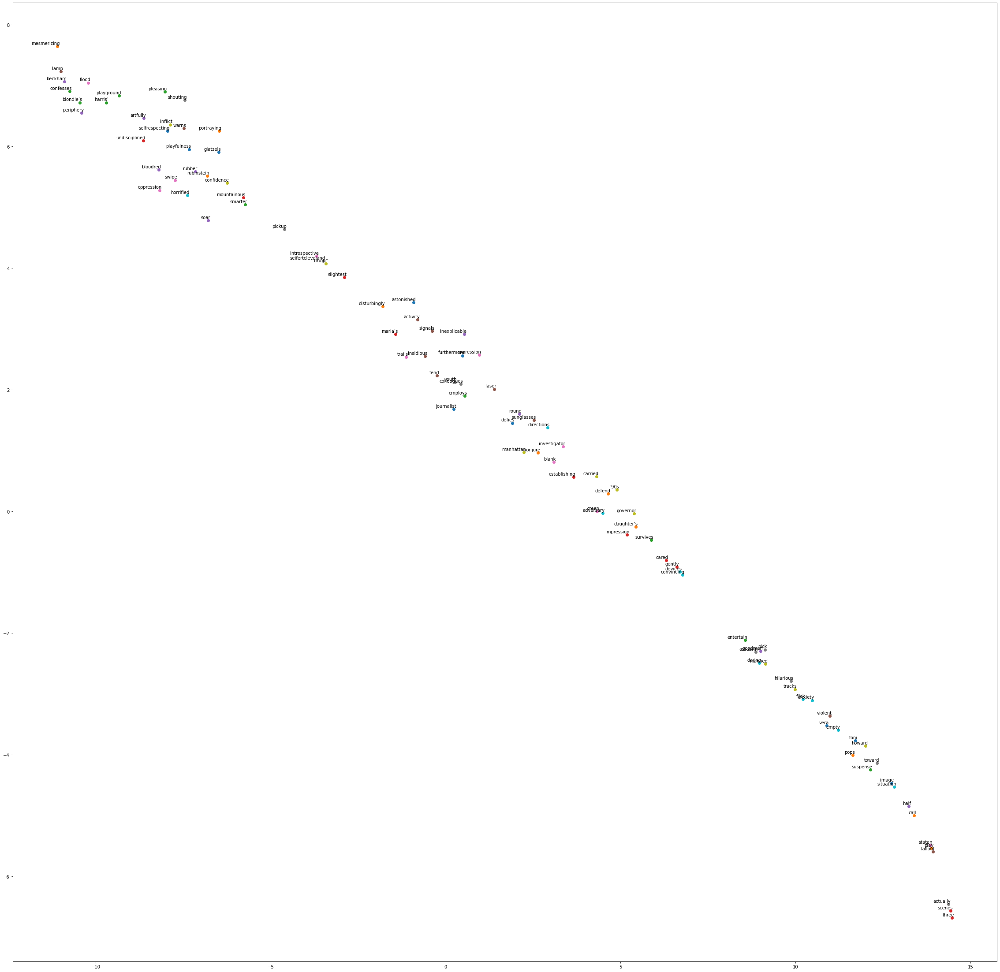

CPU times: user 2.41 s, sys: 210 ms, total: 2.62 s
Wall time: 2.17 s


In [20]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

In [21]:
df = pd.DataFrame(weights, index=random_labels)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
playfulness,0.000250,-0.013697,-0.011571,0.003049,-0.008010,-0.007283,0.024387,0.005229,-0.007096,0.005873,0.022597,-0.007686,-0.000116,0.004557,0.003269,-0.002149,-0.003702,-0.000341,-0.023453,0.019091,-0.002048,-0.026208,0.034495,-0.002097,0.003989,-0.006669,0.005328,0.004400,0.000973,0.003125,-0.009723,-0.030132,-0.034228,0.008096,0.011228,-0.020908,-0.003768,0.005779,-0.006722,0.002646,...,-0.000259,-0.012052,-0.011466,-0.004439,0.011087,-0.001741,-0.000074,-0.012489,-0.014798,0.020366,-0.010811,0.008864,-0.004088,0.029453,0.006804,-0.035345,-0.012506,-0.006615,-0.005059,0.013579,-0.009202,0.007955,0.002147,0.011850,0.003731,0.022040,0.003705,-0.005655,-0.012832,-0.010050,-0.008792,-0.006282,0.000418,-0.026009,0.003986,0.019779,-0.023471,0.009680,-0.016533,-0.004193
play,-0.019447,-0.135423,-0.150915,-0.013763,-0.142400,-0.112699,0.385206,0.074672,-0.068290,0.081831,0.349331,-0.096675,-0.017987,0.093554,-0.021614,0.000359,-0.073606,-0.051639,-0.399527,0.226431,-0.075586,-0.418956,0.587088,0.017816,-0.006449,-0.098872,0.046104,0.127289,-0.036162,0.080761,-0.217037,-0.466051,-0.507760,0.173370,0.140590,-0.264087,-0.007181,0.130940,-0.161743,0.096087,...,0.043234,-0.251636,-0.243057,-0.058238,0.233321,-0.019980,-0.032974,-0.194663,-0.272034,0.254404,-0.099099,0.205928,-0.107356,0.447284,0.124924,-0.545786,-0.136234,-0.153167,-0.094732,0.152563,-0.123284,0.145978,0.005381,0.118061,0.097287,0.387304,0.024961,-0.095921,-0.135619,-0.168437,-0.129375,-0.118487,0.017586,-0.427831,0.008459,0.320322,-0.341058,0.147639,-0.229728,-0.061690
suspense,-0.008747,-0.067899,-0.073063,-0.009925,-0.072552,-0.057024,0.200898,0.035772,-0.039732,0.035850,0.180998,-0.046887,-0.006575,0.050003,-0.013584,-0.001201,-0.040919,-0.028310,-0.202640,0.117312,-0.041275,-0.218754,0.295885,0.007024,-0.005553,-0.050698,0.021555,0.063985,-0.019818,0.038491,-0.104952,-0.235988,-0.259012,0.088798,0.076074,-0.136102,-0.002257,0.064705,-0.080426,0.048858,...,0.020961,-0.130366,-0.129521,-0.035213,0.123650,-0.007185,-0.019369,-0.094541,-0.140820,0.124670,-0.047297,0.109260,-0.051004,0.232048,0.057582,-0.276319,-0.076659,-0.073696,-0.049841,0.080809,-0.068345,0.075198,0.006882,0.060345,0.044196,0.195946,0.011228,-0.047260,-0.065333,-0.081845,-0.069419,-0.061741,0.006721,-0.221375,0.008280,0.168525,-0.168993,0.074629,-0.115106,-0.032923
maria’s,-0.000396,-0.013664,-0.011472,0.001930,-0.014515,-0.016114,0.033176,0.004919,-0.002679,0.012566,0.034508,-0.004883,0.002348,0.011806,-0.005921,0.003039,-0.004231,-0.002399,-0.039471,0.024960,-0.004535,-0.037436,0.059114,0.000993,-0.004825,-0.014498,0.003303,0.016305,-0.003085,0.006062,-0.022400,-0.049756,-0.049654,0.017161,0.013692,-0.025444,-0.000261,0.008385,-0.014494,0.007311,...,0.005794,-0.022134,-0.021263,-0.005700,0.024279,-0.003837,-0.008425,-0.016256,-0.020960,0.026469,-0.013771,0.016736,-0.014325,0.047103,0.009797,-0.050191,-0.017705,-0.017164,-0.010325,0.016424,-0.009626,0.013834,0.004569,0.012294,0.008879,0.036015,-0.000870,-0.013719,-0.012580,-0.020671,-0.010402,-0.013872,-0.002107,-0.036638,0.004067,0.031971,-0.037231,0.009538,-0.024034,-0.008769
soar,-0.005244,-0.008954,-0.007405,-0.005813,-0.009671,-0.008331,0.028658,0.001183,-0.002459,0.003834,0.022496,-0.007889,0.001647,0.007365,-0.000058,0.004076,-0.008214,0.000142,-0.024101,0.018908,-0.001460,-0.026062,0.039359,0.002453,-0.000102,-0.004580,0.007170,0.008357,-0.004806,0.008908,-0.011265,-0.027054,-0.036370,0.011521,0.012037,-0.022591,-0.004563,0.013006,-0.007221,0.006898,...,0.007535,-0.018239,-0.011769,-0.008042,0.011531,0.001209,-0.007275,-0.014601,-0.015189,0.021255,-0.002146,0.018235,-0.005926,0.034075,0.003782,-0.039799,-0.006889,-0.009327,-0.005070,0.006660,-0.007721,0.004699,0.003566,0.012372,0.009888,0.029768,0.003850,-

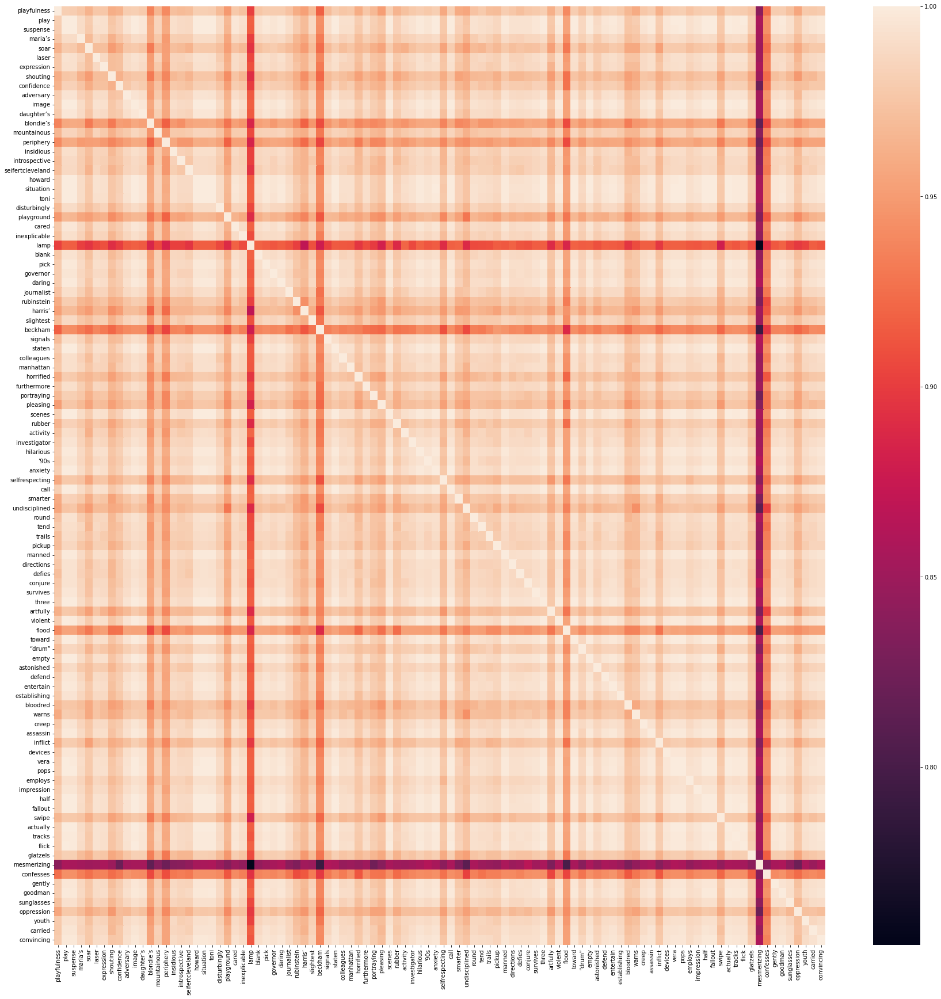

In [22]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 200 Embedding Dimensions

In [23]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 200)

#### Plot word2vec TSNE

In [24]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

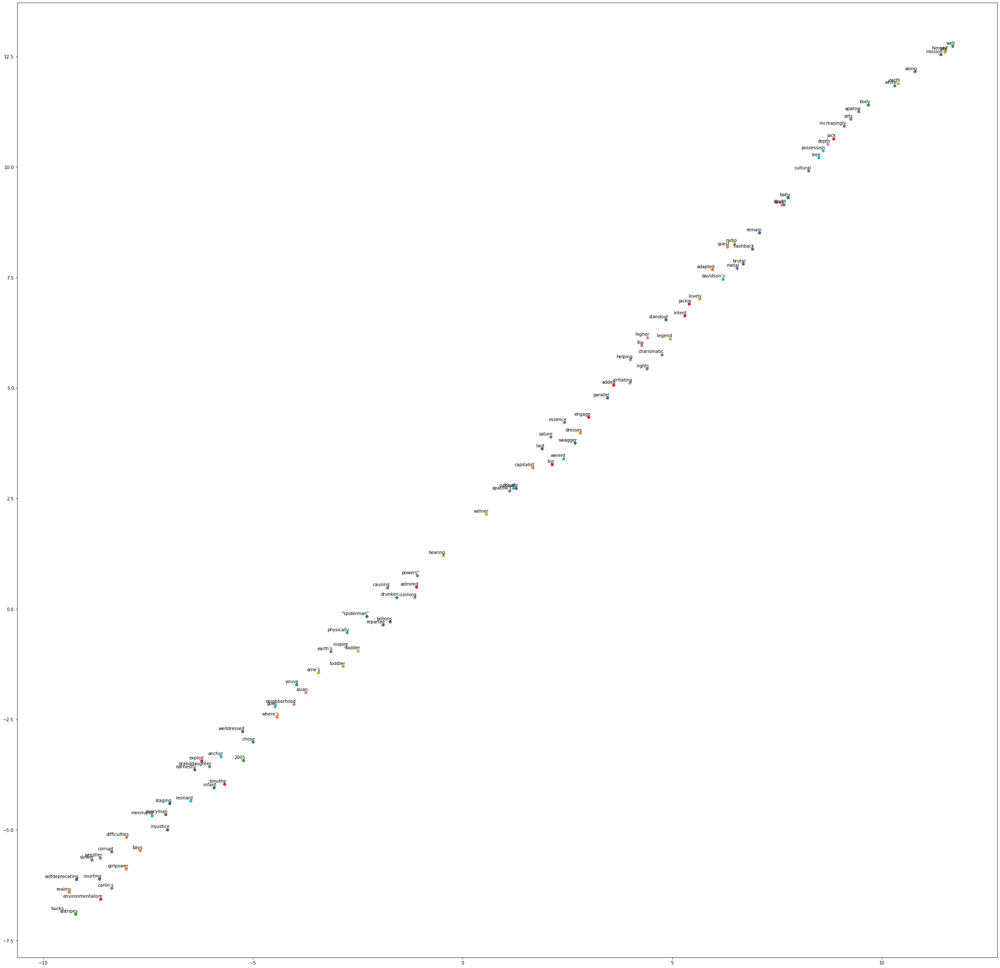

CPU times: user 2.76 s, sys: 148 ms, total: 2.91 s
Wall time: 2.28 s


In [25]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

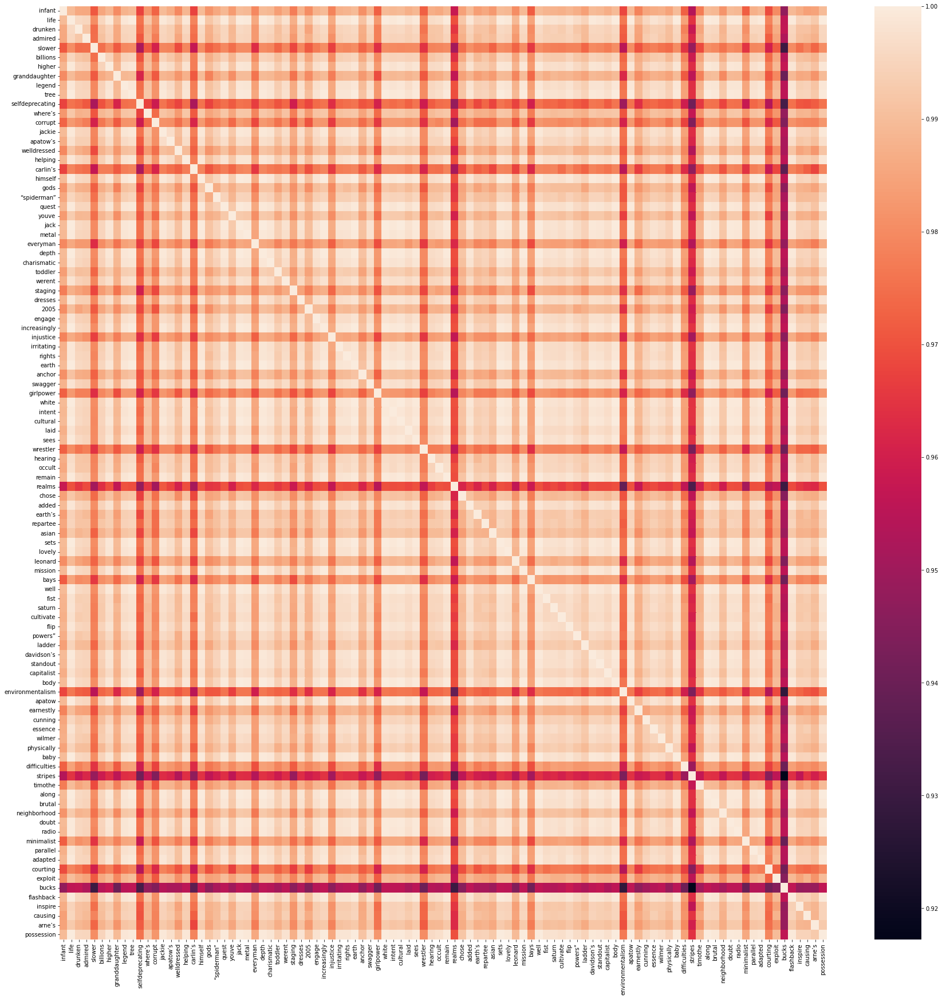

In [26]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 300 Embedding Dimensions

In [27]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 300)

#### Plot word2vec TSNE

In [28]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

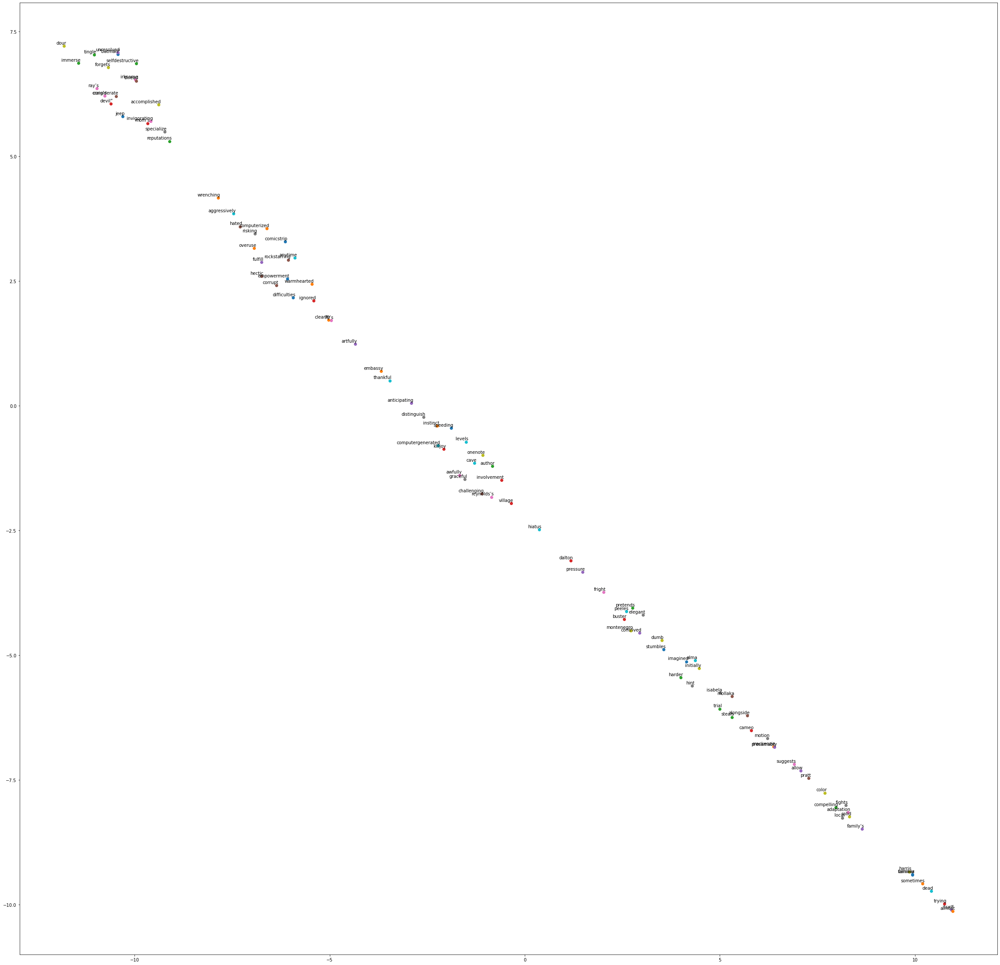

CPU times: user 2.64 s, sys: 159 ms, total: 2.79 s
Wall time: 2.22 s


In [29]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

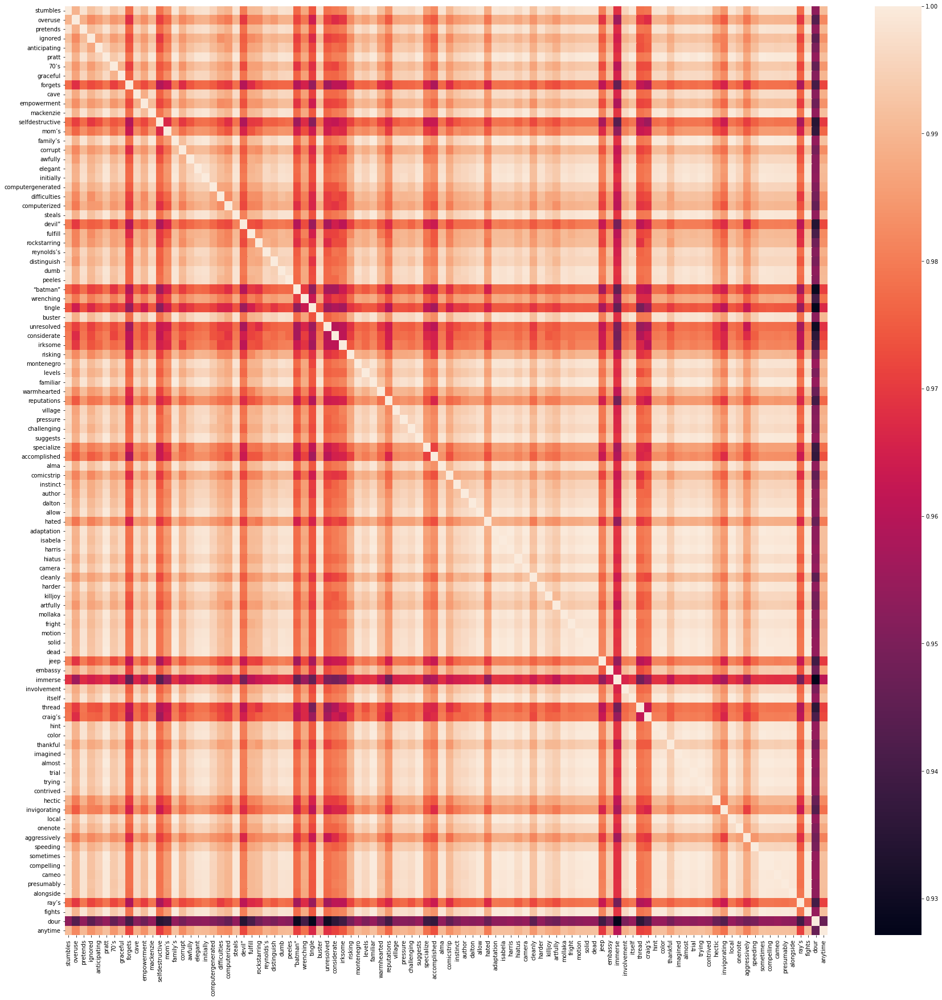

In [30]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

## Documents by Embedding Matrix

### 100 Embedding Dimensions

In [31]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 100)

#### Plot doc2vec TSNE 

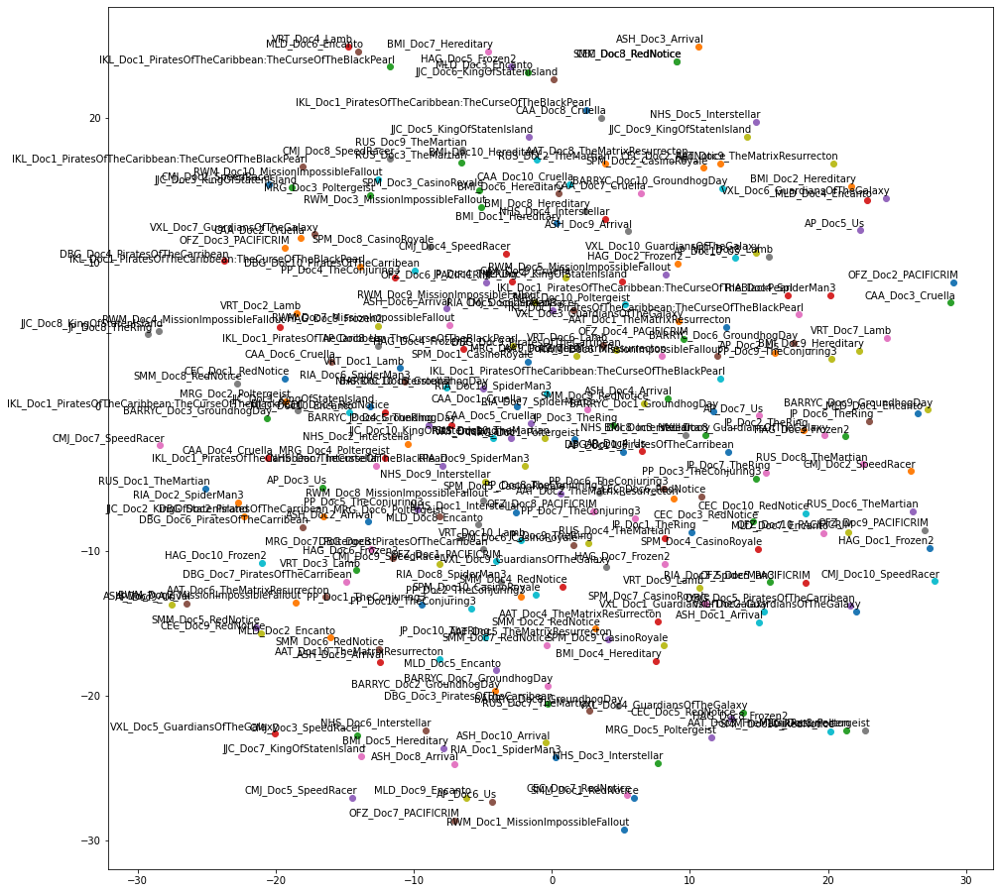

In [32]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [33]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

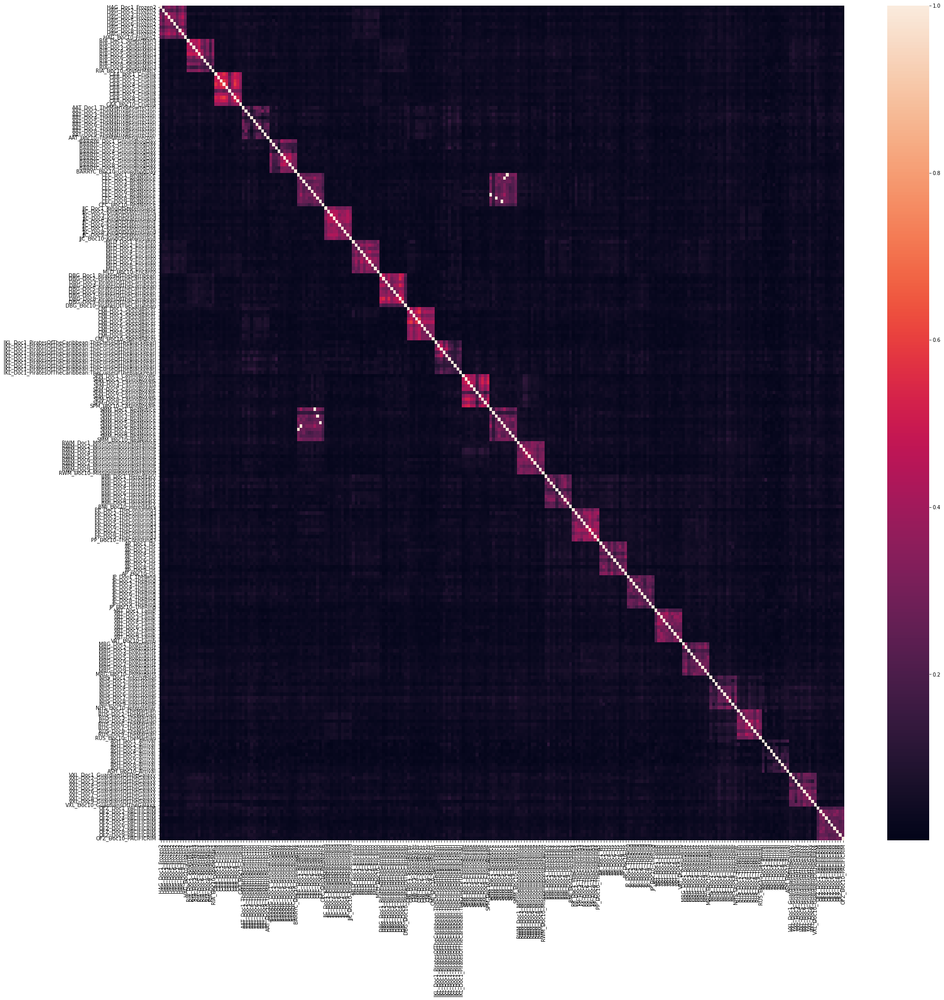

In [34]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 200 Embedding Dimensions

In [35]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 200)

#### Plot doc2vec TSNE 

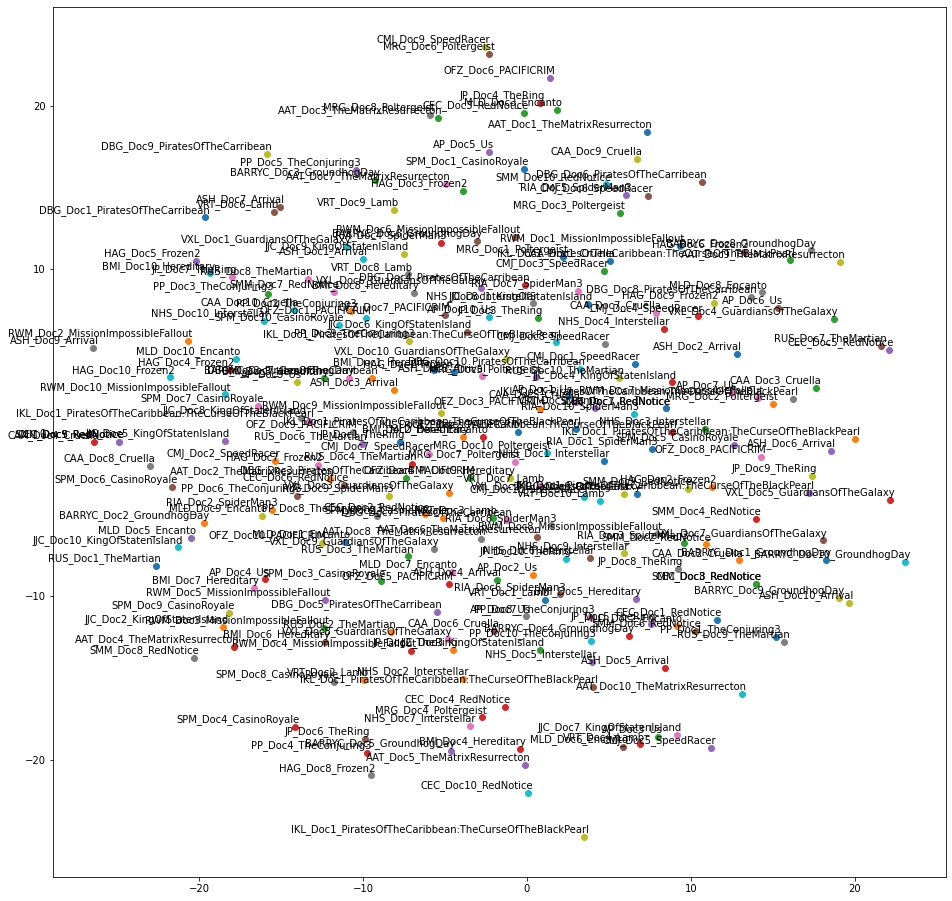

In [36]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [37]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

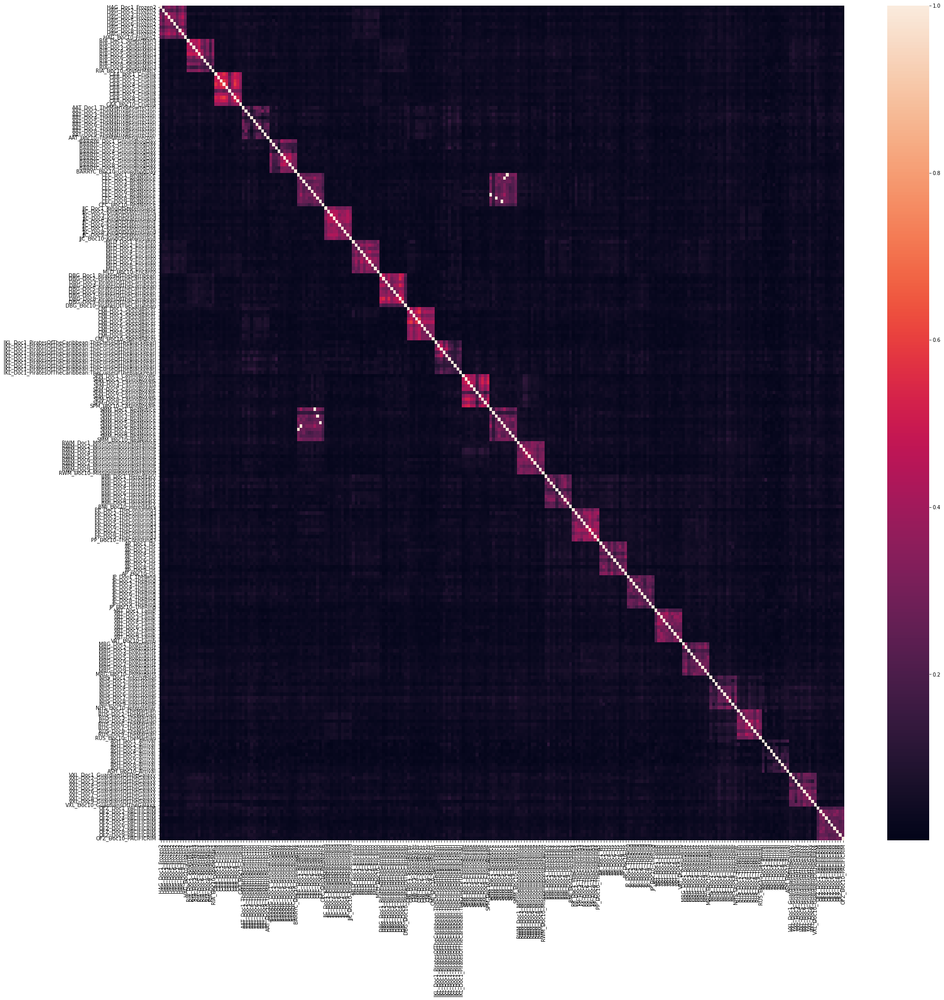

In [38]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 300 Embedding Dimensions

In [39]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 300)

#### Plot doc2vec TSNE 

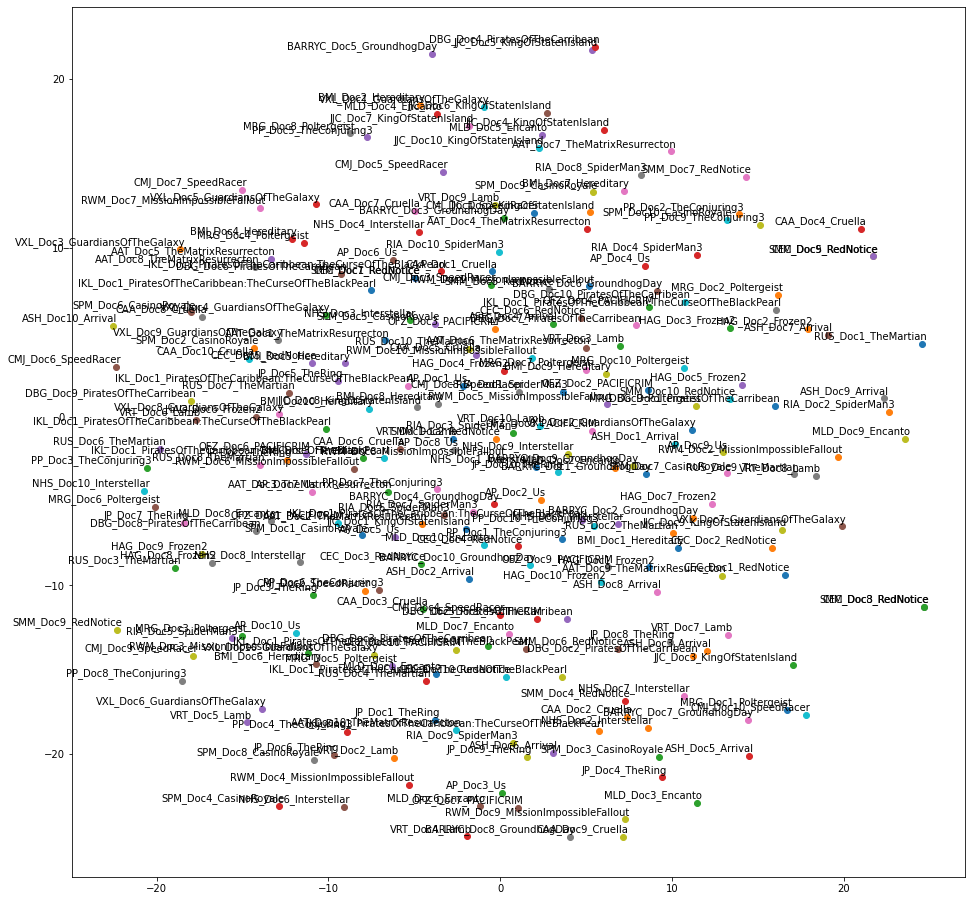

In [40]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [41]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

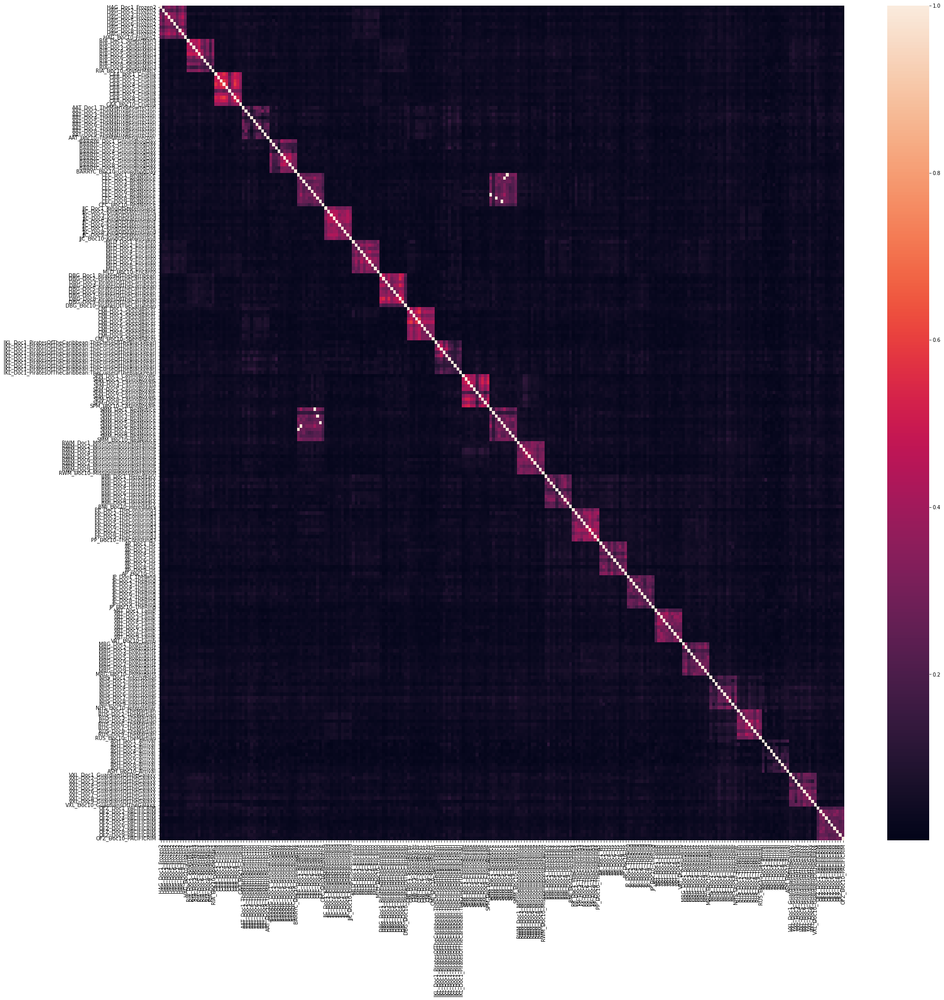

In [42]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

# Method 2 Experiments



## Data wrangling
baseline = tokenization + normalization + stemming + stop words

### Functions for pre-processing

In [43]:
def clean_doc(doc): 
    #split document into individual words
    doc = ' '.join(remove_stop_words(doc))
    doc = apply_stemming(doc)

    tokens=doc.split()
    re_punc = re.compile('[%s]' % re.escape(string.punctuation))
    # remove punctuation from each word
    tokens = [re_punc.sub('', w) for w in tokens]
    # remove remaining tokens that are not alphabetic
    #tokens = [word for word in tokens if word.isalpha()]
    # filter out short tokens
    tokens = [word for word in tokens if len(word) > 3]
    #lowercase all words
    tokens = [word.lower() for word in tokens]
    
    return tokens

### Pre-process data set

In [44]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')
path_to_file='ClassCorpus.csv'
data = pd.read_csv(path_to_file)

In [45]:
#process documents
titles, final_processed_text, processed_text = process_corpus(data)

#number of tokens
len_tokens = []
for i in final_processed_text:
  len_tokens.append(len(i))

print(sum(len_tokens))

#tokens from ten random texts in the corpus
for i in np.random.randint(0,249,10):
  print(final_processed_text[i])

666661
lift titl interpol mostwant list dodgebal director rawson marshal thurber twisti treasurehunt lark notic blur line good instead focus notori thiev better break sarcast master forger nolan booth reliabl whini ryan reynold upscal nemesi known bishop wineanddiney gadot their goal collect three ornament worth million origin gift anthoni cleopatra scatter corner globe while booth bishop ricochet around world engag amount highstak easter hunt crimin profil john hartley dwayn johnson bring make fastpac frequent amus divertiss releas netflix first theater stream subscrib week later notic work surprisingli well script thurber wrote blaze booth steal cleopatra first narrowli escap hartley clutch apprehend arriv home anoth hemispher then bishop swipe recov prize land hartley water sinc interpol agent charg inspector ritu arya suspect former profil snag next thing hartley know share cell booth remot russian prison squar actionmovi territori thurber took improb height rockstar skyscrap certa

##Document Vectorization using tf-idf

### Calculates TFIDF and Saves TFIDF Values for Terms

In [46]:
vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, norm=None)
transformed_documents = vectorizer.fit_transform(final_processed_text)
transformed_documents_as_array = transformed_documents.toarray()

output_dir ="TFIDF_output.csv"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for counter, doc in enumerate(transformed_documents_as_array):
    # construct a dataframe
    tf_idf_tuples = list(zip(vectorizer.get_feature_names(), doc))
    one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples
                                              ,columns=['term', 'score']).sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # output to a csv using the enumerated value for the filename
    one_doc_as_df.to_csv(output_dir+"/"+str(titles[counter]))
    

In [47]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/TFIDF_output.csv/')

top_term_scores().head(10)

,Term,Score
67,ideolog,2.46
1283,guardian,2.10
1282,galaxi,1.50
1090,marvel,1.41
1384,quill,1.36
68,adult,1.35
430,prologu,1.27
412,formula,1.19
1285,ikea,1.17
592,hypocrisi,1.08


##Terms by Embedding Matrix

### 100 Embedding Dimensions

In [48]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 100)

#### Plot word2vec TSNE

In [49]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

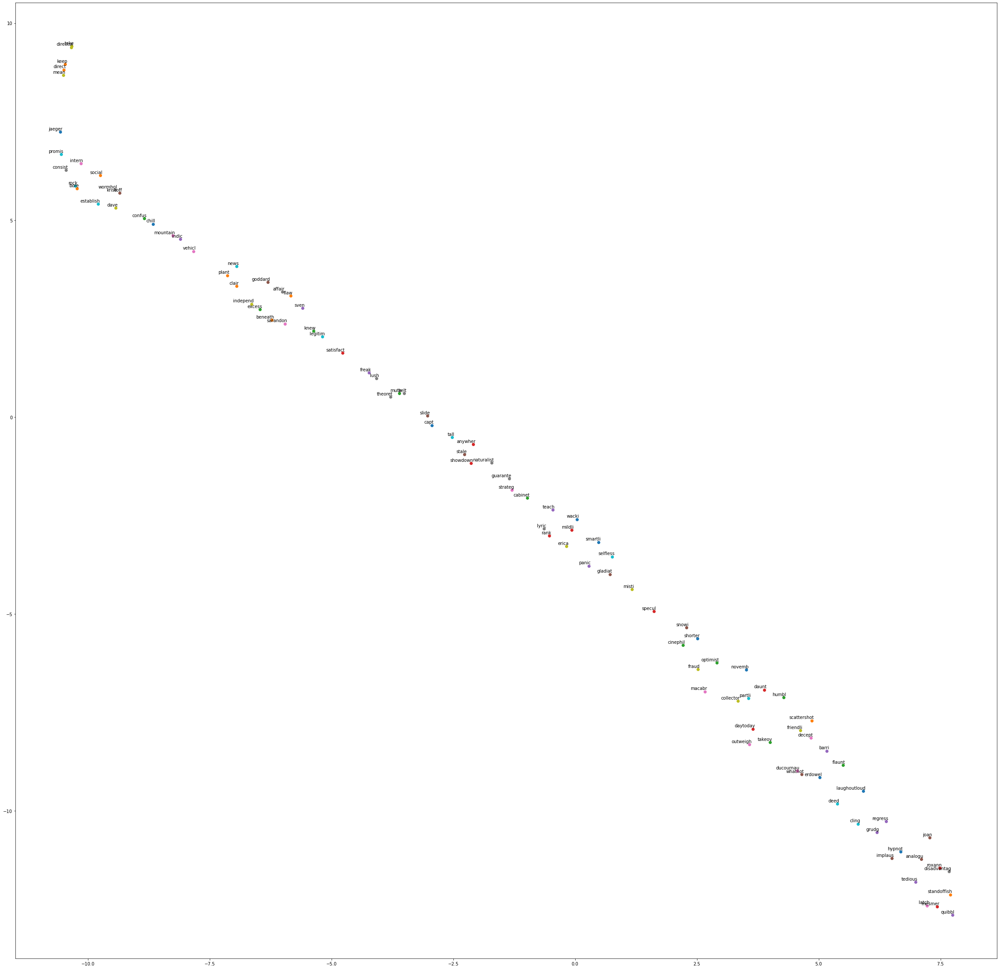

CPU times: user 2.65 s, sys: 124 ms, total: 2.77 s
Wall time: 2.31 s


In [50]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

In [51]:
df = pd.DataFrame(weights, index=random_labels)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
jaeger,0.258320,-0.026561,0.168359,0.051405,-0.218286,-0.160965,0.352317,-0.009196,-0.109726,0.000369,0.115170,0.222882,0.090338,-0.024184,0.257654,0.126831,-0.057301,-0.281031,0.039425,0.036549,-0.142671,-0.167937,0.237310,-0.052461,-0.070002,0.111919,0.244861,0.021287,0.375720,0.005655,-0.054358,-0.416949,-0.151110,0.321378,-0.034902,-0.435105,-0.030530,0.020553,-0.063427,-0.129732,...,-0.091712,-0.242048,-0.109883,0.012078,-0.056372,0.009856,-0.013555,-0.270954,-0.121122,0.276652,-0.210514,0.003415,0.042466,0.333770,0.190477,-0.072922,-0.173462,0.038465,-0.084518,-0.162741,-0.002822,0.114142,-0.041128,-0.044680,0.198449,0.318572,0.088324,-0.153381,-0.141915,-0.279004,0.055046,0.079215,0.158610,-0.354749,0.165451,0.157397,0.048718,0.097039,-0.237925,-0.058246
direct,0.466962,-0.043721,0.298802,0.093283,-0.397212,-0.290858,0.627216,-0.014045,-0.202625,0.003741,0.206911,0.395573,0.157677,-0.043605,0.465784,0.222159,-0.094385,-0.508498,0.074683,0.062510,-0.251698,-0.300061,0.427599,-0.099546,-0.127676,0.205273,0.439248,0.039579,0.674137,0.019169,-0.091064,-0.740694,-0.267983,0.581432,-0.066449,-0.775974,-0.047843,0.037405,-0.115864,-0.234663,...,-0.169255,-0.431846,-0.197911,0.029564,-0.100363,0.017428,-0.022568,-0.478175,-0.203648,0.481030,-0.375517,0.001936,0.069473,0.593069,0.337621,-0.136191,-0.321318,0.062556,-0.149645,-0.282511,-0.014653,0.197089,-0.081555,-0.084815,0.347282,0.565612,0.162041,-0.273005,-0.250576,-0.503260,0.094319,0.141292,0.287443,-0.627997,0.297359,0.272795,0.087031,0.179171,-0.425457,-0.104477
flaunt,0.015730,0.002326,0.011687,0.007731,-0.020955,-0.007658,0.024640,-0.001379,-0.009635,-0.002663,0.005429,0.016007,0.005500,0.001212,0.013905,0.007195,0.000784,-0.017557,0.003646,-0.001174,-0.007348,-0.015138,0.015509,-0.004696,-0.008598,0.007258,0.016839,0.002035,0.029039,-0.002845,-0.006607,-0.031851,-0.010541,0.024622,-0.003615,-0.028958,-0.006356,0.003639,-0.001523,-0.005781,...,-0.007264,-0.017128,-0.007689,-0.001284,0.000795,0.000490,-0.004706,-0.017565,-0.011409,0.023814,-0.015684,0.003825,0.005767,0.020875,0.013978,-0.006870,-0.014849,0.007136,-0.009376,-0.012368,0.001357,0.010894,-0.002913,-0.001882,0.009423,0.022690,0.002466,-0.011190,-0.014278,-0.015515,0.007340,0.002710,0.009690,-0.028519,0.010421,0.014461,0.007858,0.011998,-0.015568,0.000090
showdown,0.040419,-0.002988,0.029860,0.010472,-0.040271,-0.025938,0.056735,0.001259,-0.014772,-0.002881,0.015081,0.035995,0.014820,-0.004575,0.040587,0.020039,-0.012460,-0.044255,0.006652,0.001267,-0.021958,-0.023011,0.037205,-0.008529,-0.011518,0.022362,0.043177,-0.000157,0.065497,0.006128,-0.004100,-0.065271,-0.020799,0.057015,-0.009925,-0.068623,-0.004624,0.005610,-0.014670,-0.025482,...,-0.018870,-0.043513,-0.015279,0.004891,-0.007727,0.003579,0.000266,-0.040814,-0.023528,0.048234,-0.033370,0.002008,0.009660,0.053246,0.026292,-0.009976,-0.027616,0.007389,-0.014428,-0.021652,-0.004276,0.014239,-0.009621,-0.010689,0.036042,0.052784,0.016063,-0.020302,-0.026255,-0.043256,0.008029,0.017459,0.025316,-0.052796,0.027232,0.026807,0.011646,0.012958,-0.035110,-0.012717
sven,0.079541,-0.009833,0.053102,0.015680,-0.063958,-0.050774,0.097080,-0.003622,-0.036675,0.001599,0.038276,0.060120,0.023372,-0.010203,0.074088,0.033777,-0.019941,-0.081510,0.009655,0.014060,-0.045117,-0.052044,0.070201,-0.014522,-0.019623,0.033603,0.074598,0.002197,0.110957,-0.001411,-0.015660,-0.120891,-0.045959,0.095269,-0.006954,-0.126312,-0.010097,0.008156,-0.019187,-0.040399,...,-0.027993,-0.073392,-0.034910,0.004402,-0.017967,0.004060,-0.008901,-0.075047,-0.033565,0.075341,-0.066276,0.003637,0.015366,0.093631,0.049627,-0.023589,-0.047177,0.008662,-0.019797,-0.043518,-0.004623,0.030666,-0.017274,-0.012860,0.055904,0.093592,0.025771,-0.041122,-0.038667,-0.079287

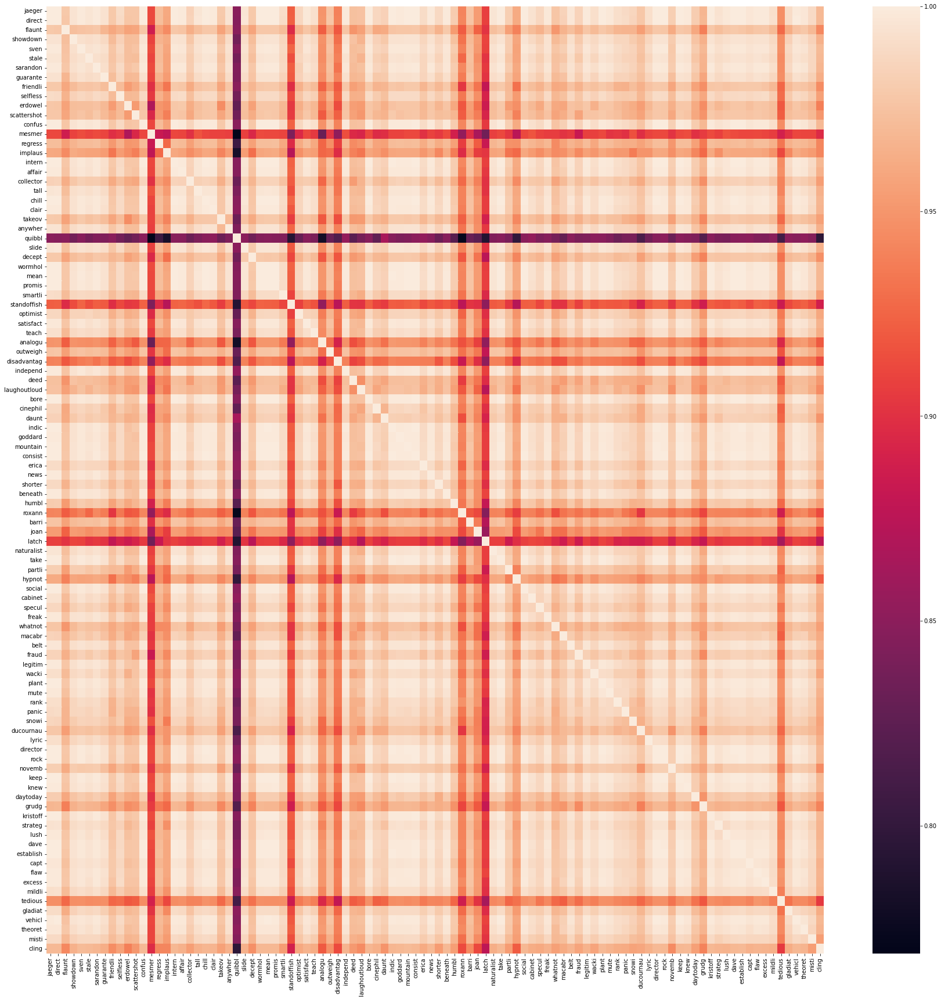

In [52]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 200 Embedding Dimensions

In [53]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 200)

#### Plot word2vec TSNE

In [54]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

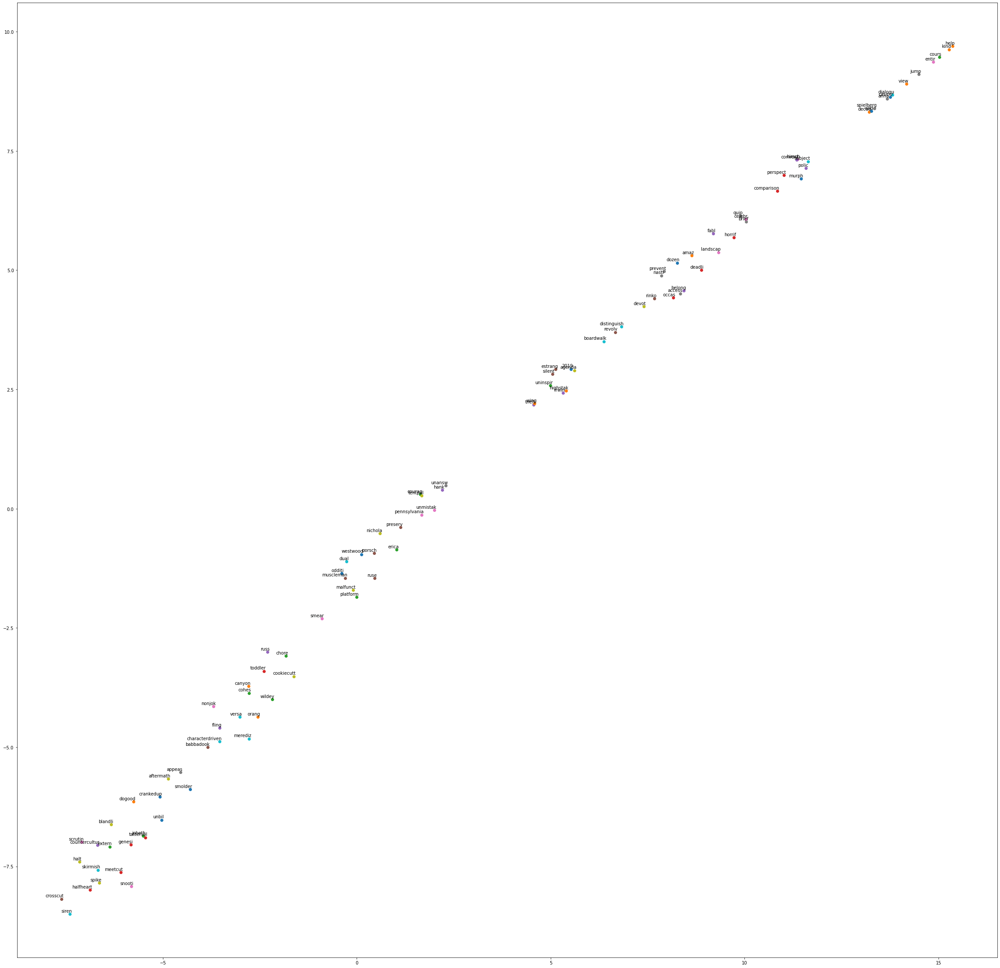

CPU times: user 2.74 s, sys: 131 ms, total: 2.87 s
Wall time: 2.24 s


In [55]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

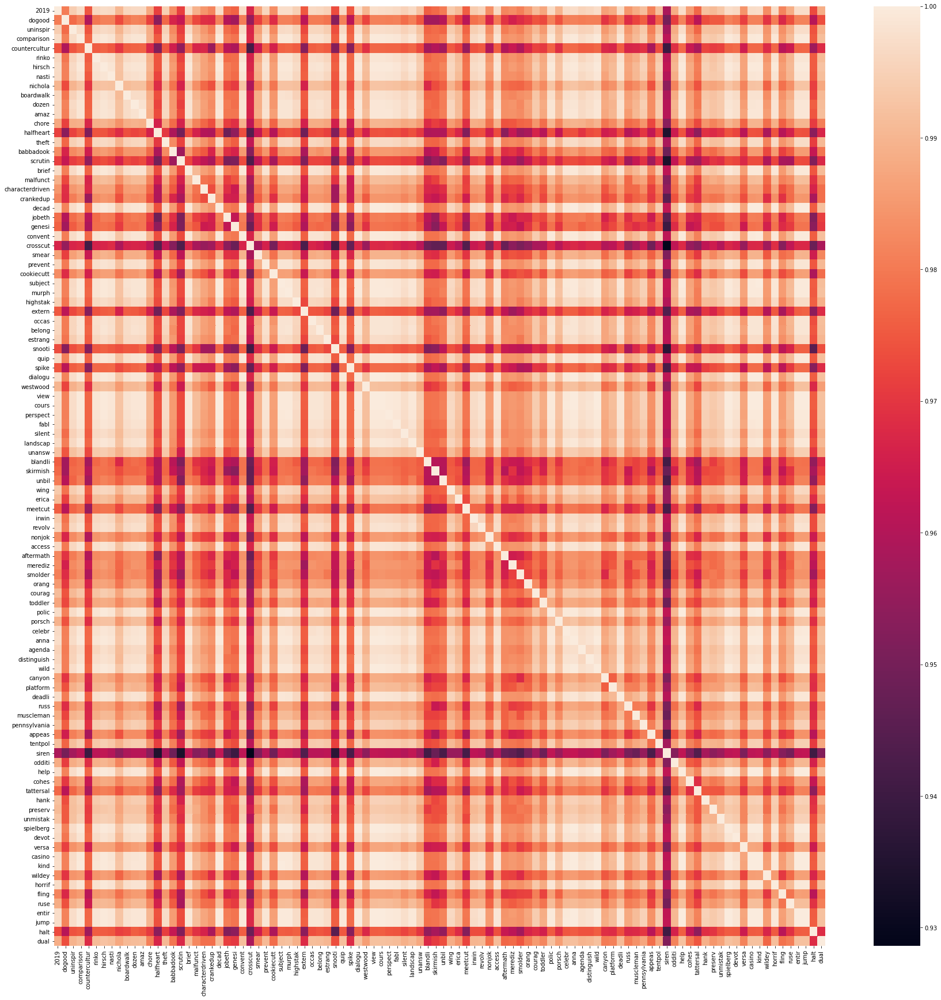

In [56]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 300 Embedding Dimensions

In [57]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 300)

#### Plot word2vec TSNE

In [58]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

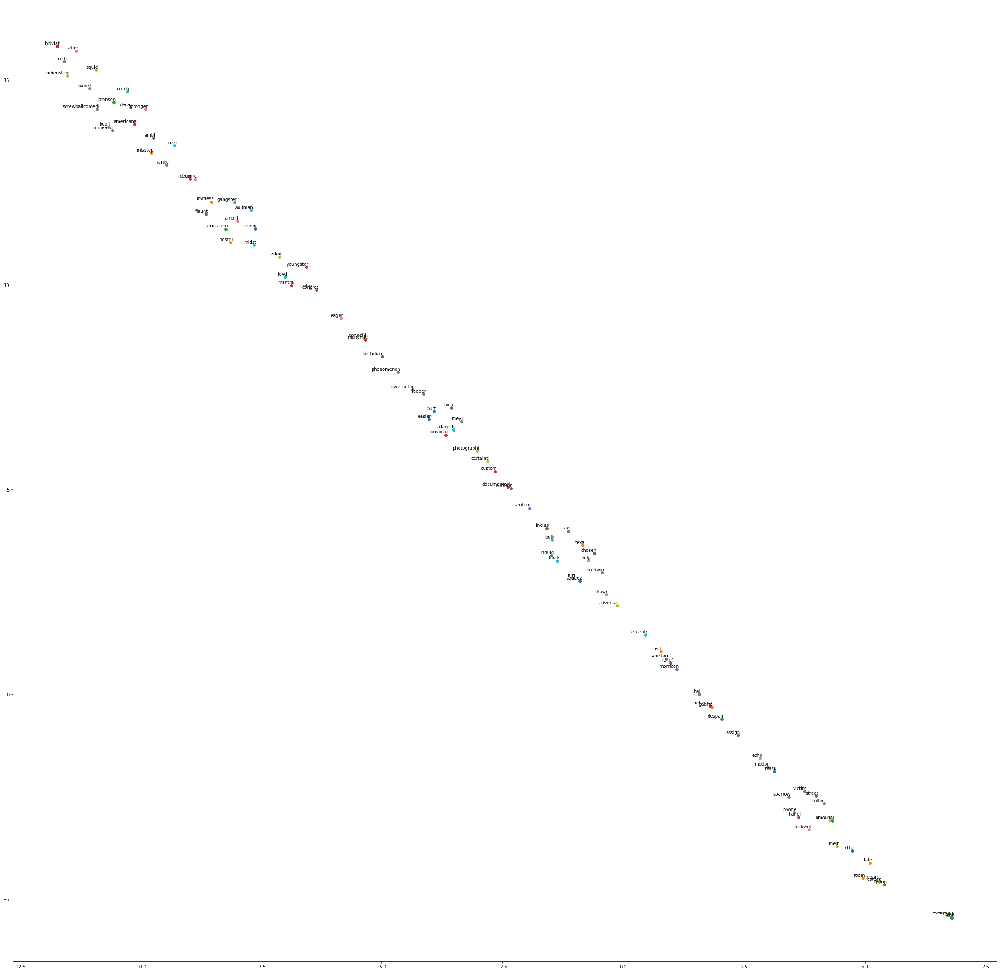

CPU times: user 2.86 s, sys: 150 ms, total: 3.01 s
Wall time: 2.39 s


In [59]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

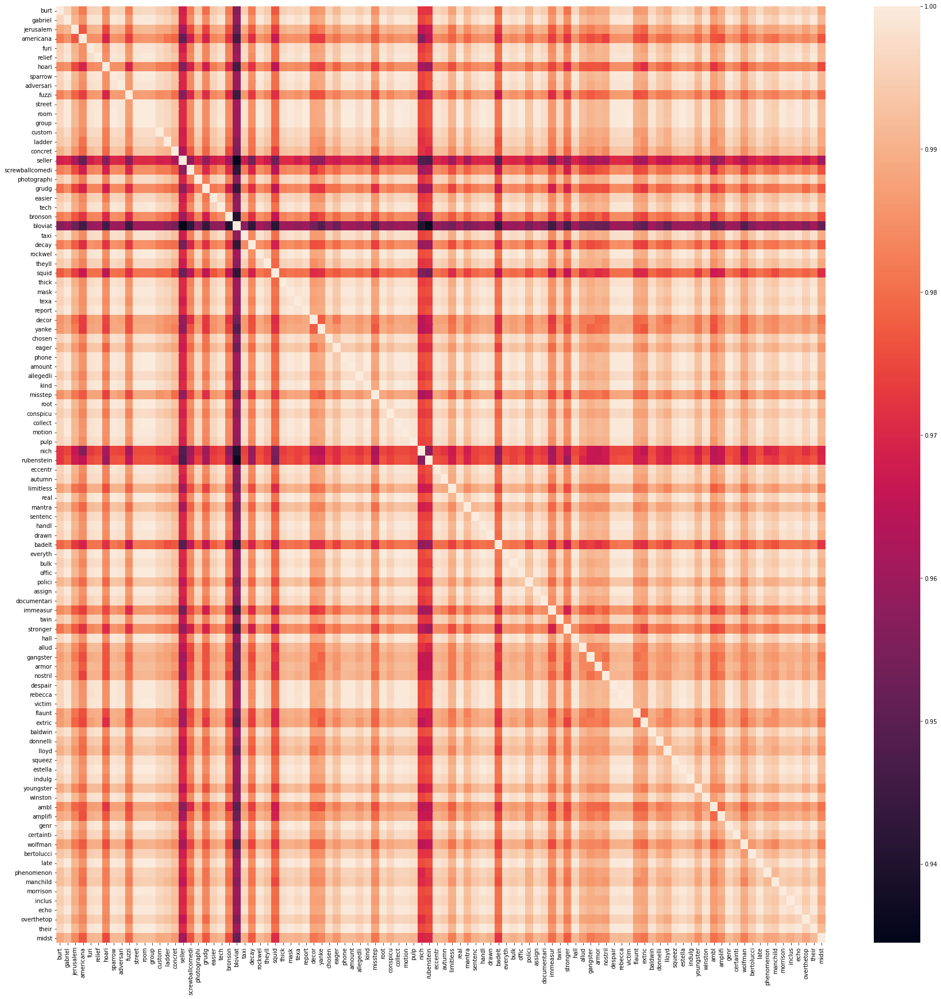

In [60]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

## Documents by Embedding Matrix

### 100 Embedding Dimensions

In [61]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 100)

#### Plot doc2vec TSNE 

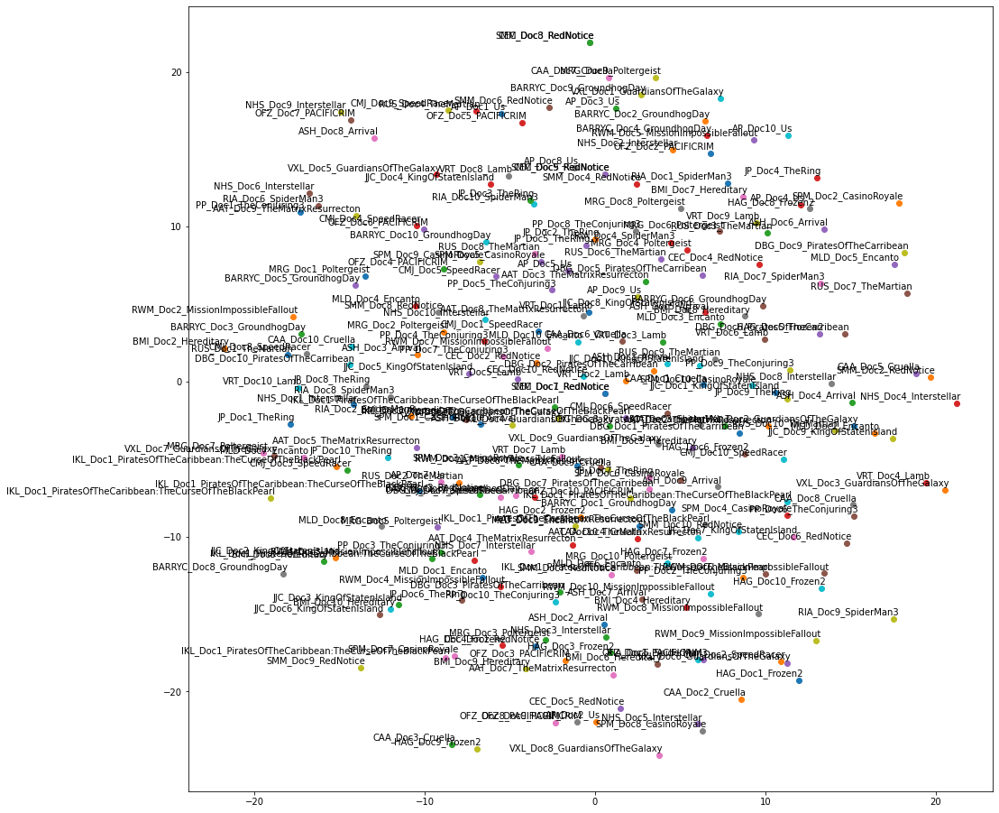

In [62]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [63]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

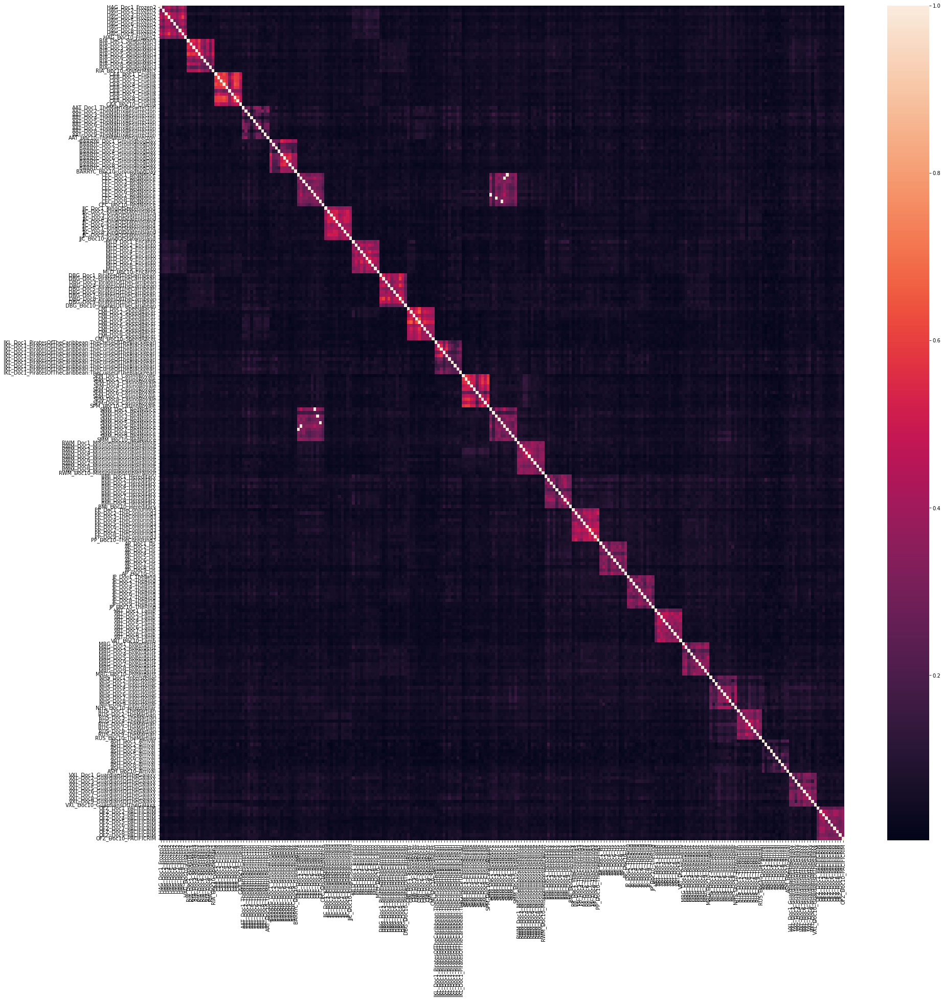

In [64]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 200 Embedding Dimensions

In [65]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 200)

#### Plot doc2vec TSNE 

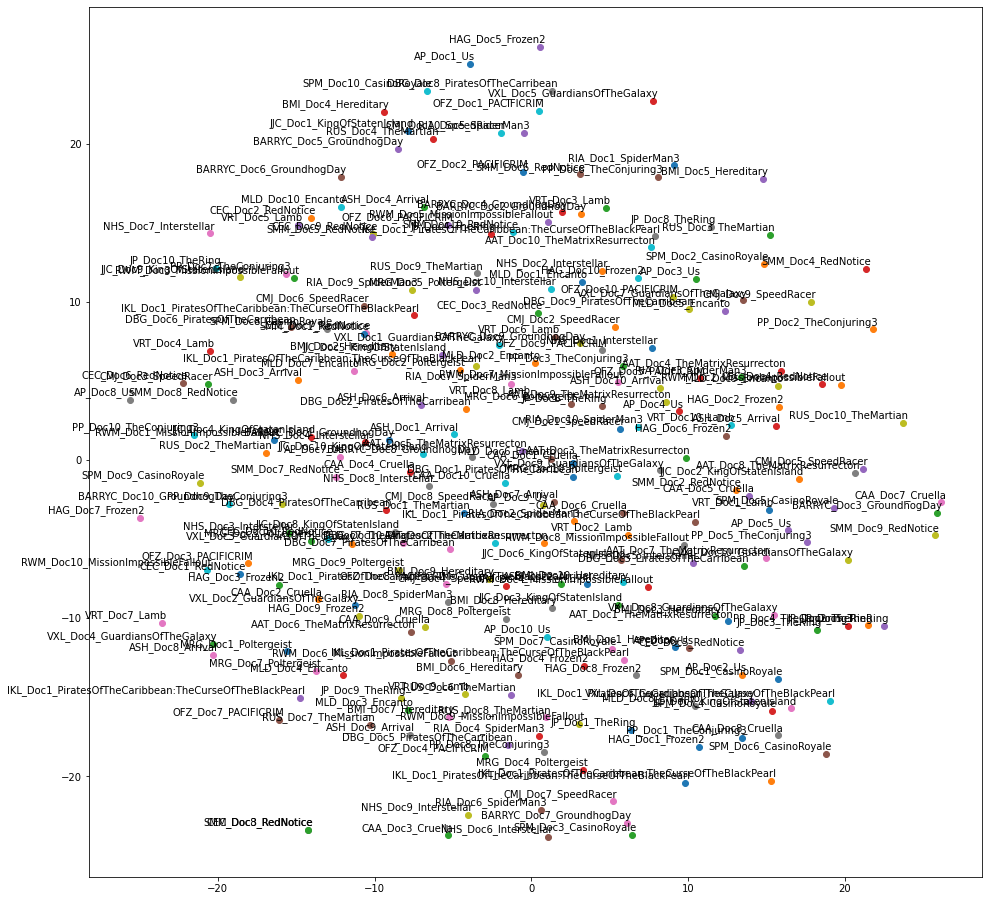

In [66]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [67]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

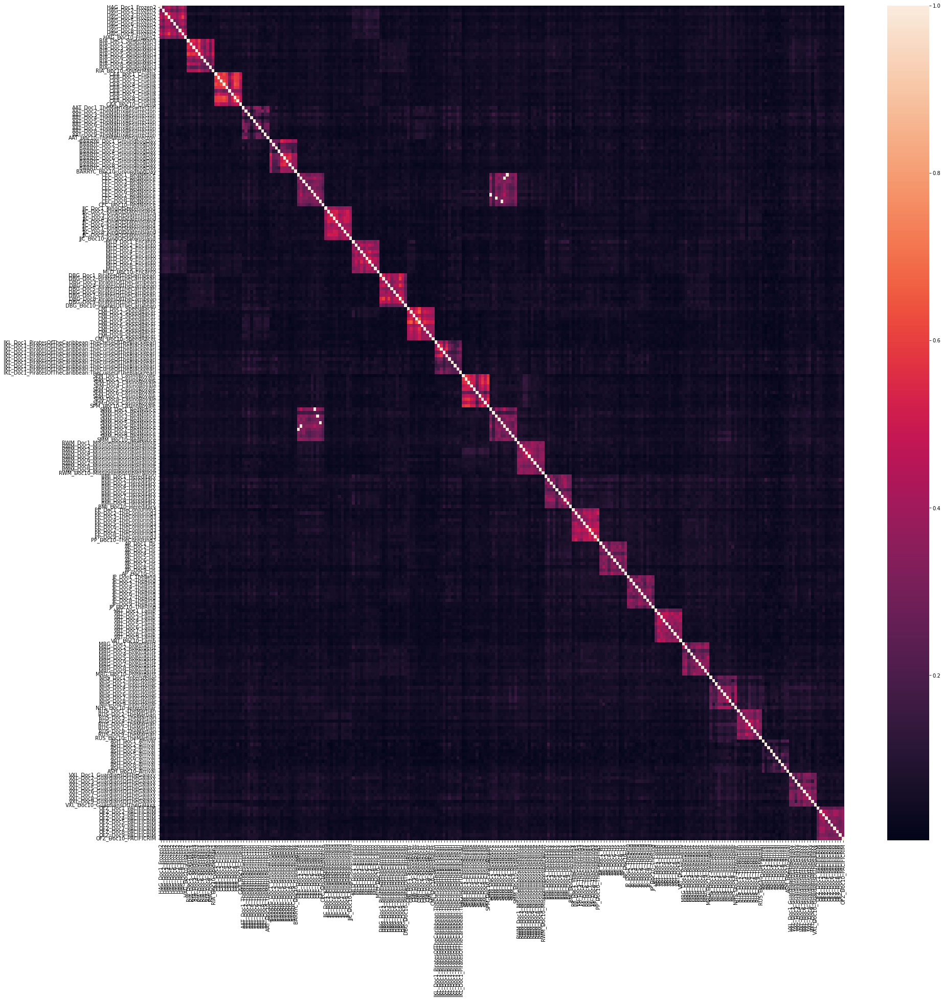

In [68]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 300 Embedding Dimensions

In [69]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 300)

#### Plot doc2vec TSNE 

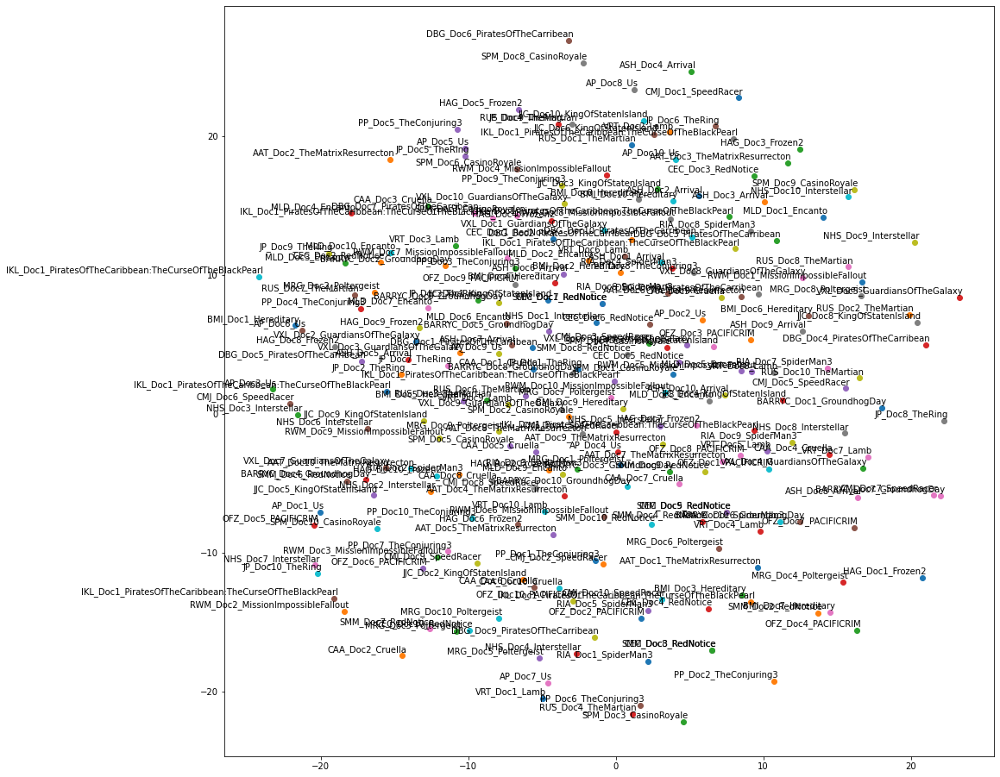

In [70]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [71]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

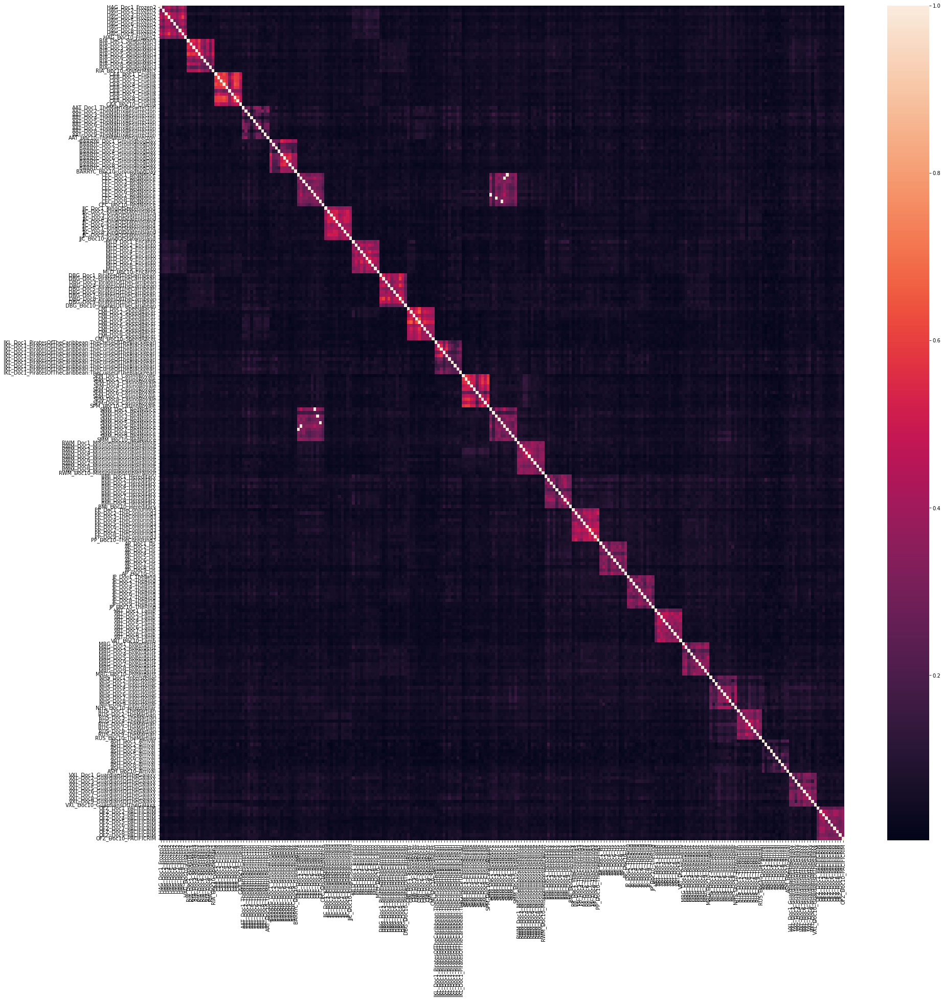

In [72]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

# Method 3 Experiments



## Data wrangling
baseline = tokenization + normalization + lemmatization + stop words + remove non-alphabetic tokens

### Functions for pre-processing

In [73]:
def clean_doc(doc): 
    #split document into individual words
    doc = ' '.join(remove_stop_words(doc))
    doc = apply_lemmatization(doc)

    tokens=doc.split()
    re_punc = re.compile('[%s]' % re.escape(string.punctuation))
    # remove punctuation from each word
    tokens = [re_punc.sub('', w) for w in tokens]
    # remove remaining tokens that are not alphabetic
    tokens = [word for word in tokens if word.isalpha()]
    # filter out short tokens
    tokens = [word for word in tokens if len(word) > 3]
    #lowercase all words
    tokens = [word.lower() for word in tokens]
    
    return tokens

### Pre-process data set

In [74]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')
path_to_file='ClassCorpus.csv'
data = pd.read_csv(path_to_file)

In [75]:
#process documents
titles, final_processed_text, processed_text = process_corpus(data)

#number of tokens
len_tokens = []
for i in final_processed_text:
  len_tokens.append(len(i))

print(sum(len_tokens))

#tokens from ten random texts in the corpus
for i in np.random.randint(0,249,10):
  print(final_processed_text[i])

751261
buddy actioncomedy blend element james bond mission impossible entrapment indiana jones true lies fugitive many many notice welcome throwback omnipresent franchise movie star original case original blockbuster ruled industry course writerdirector rawson marshall thurber spectacular limited week beginning multiplex predecessor rather debuting netflix streaming platform expensive endeavor date reported cost upwards million nonetheless something refreshingly school megabudget project money screen giant globetrotting piece another hinging success charisma sexy bruising funny lead notice would resembled number summer movie built around appeal marquee headliner slambang premise today however feel practically anachronistic refreshing gaudily expensive production strive entertain frantic sizzle witty oneliner last come ryan reynolds onethird film alist trio also includes dwayne rock johnson gadot there depth wellworn text retrofitted occasional sort venture generally make anymore fact m

##Document Vectorization using tf-idf

### Calculates TFIDF and Saves TFIDF Values for Terms

In [76]:
vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, norm=None)
transformed_documents = vectorizer.fit_transform(final_processed_text)
transformed_documents_as_array = transformed_documents.toarray()

output_dir ="TFIDF_output.csv"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for counter, doc in enumerate(transformed_documents_as_array):
    # construct a dataframe
    tf_idf_tuples = list(zip(vectorizer.get_feature_names(), doc))
    one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples
                                              ,columns=['term', 'score']).sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # output to a csv using the enumerated value for the filename
    one_doc_as_df.to_csv(output_dir+"/"+str(titles[counter]))
    

In [77]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/TFIDF_output.csv/')

top_term_scores().head(10)

,Term,Score
85,ideological,2.05
1441,guardians,1.82
1440,galaxy,1.50
86,formulaic,1.47
1243,marvel,1.46
1566,quill,1.36
87,adult,1.35
522,prologue,1.27
278,flying,1.27
1443,ikea,1.17


##Terms by Embedding Matrix

### 100 Embedding Dimensions

In [78]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 100)

#### Plot word2vec TSNE

In [79]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

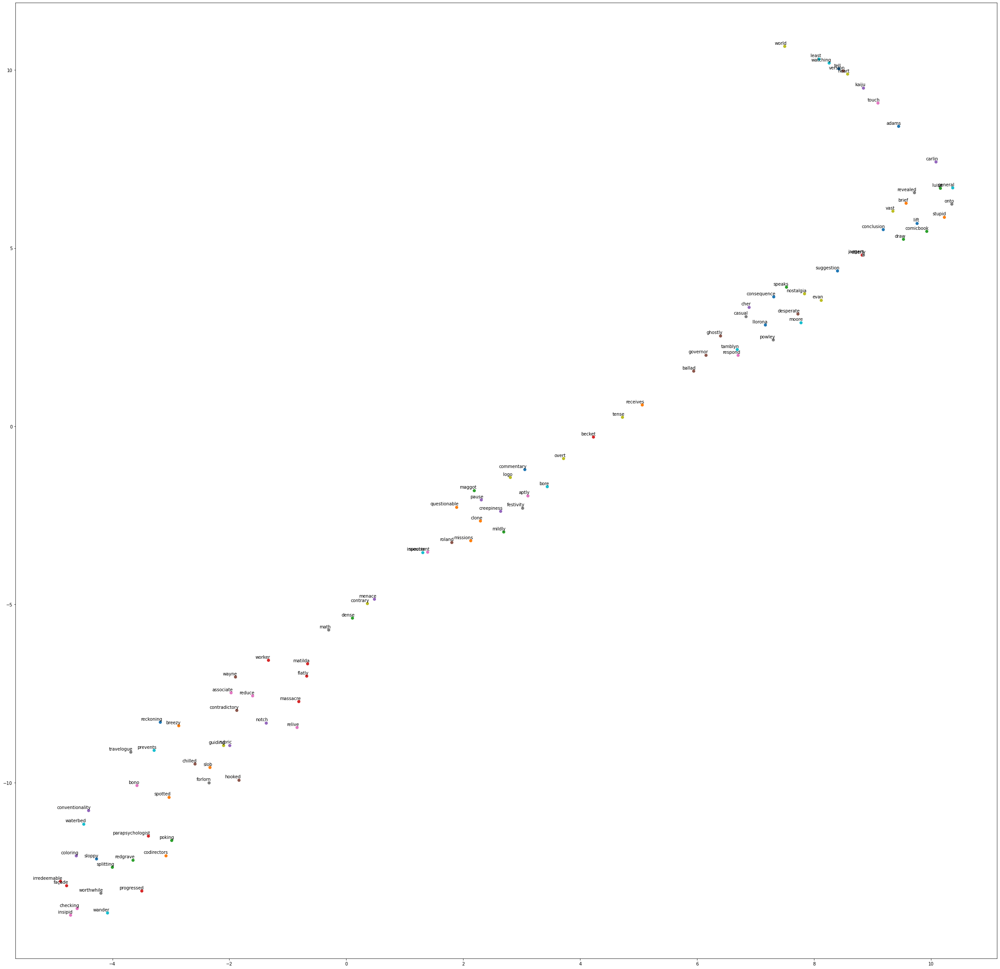

CPU times: user 2.72 s, sys: 156 ms, total: 2.88 s
Wall time: 2.36 s


In [80]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

In [81]:
df = pd.DataFrame(weights, index=random_labels)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
sloppy,0.011397,-0.003219,-0.000888,-0.006101,0.001771,-0.004721,0.009414,-0.000362,0.000536,-0.006168,0.007879,0.004900,0.002059,-0.003030,0.000807,0.010511,0.002885,-0.003016,-0.012986,-0.000528,-0.006235,-0.000052,0.015421,0.000331,-0.006704,-0.008219,0.001279,0.006466,0.009235,-0.005965,-0.010509,-0.010426,-0.008915,0.011277,0.004963,-0.004819,-0.002314,0.001131,-0.002087,-0.001898,...,-0.001798,-0.007071,-0.001295,0.003860,-0.005542,-0.001258,-0.000202,-0.002790,-0.008495,0.002654,0.000613,-0.000203,-0.003653,0.007202,0.009549,-0.009844,-0.002928,-0.004256,-0.003117,-0.009931,-0.006801,0.004238,-0.003021,0.001895,0.007402,0.001960,-0.012152,-0.005218,-0.002326,-0.010986,-0.006335,-0.001007,0.004790,-0.010360,0.003824,0.011918,-0.002526,0.002737,-0.007088,-0.003625
slob,0.004668,-0.006469,0.003963,-0.003473,-0.002481,-0.012859,0.018243,0.003146,-0.001579,-0.003845,0.014602,0.010026,0.005006,-0.008620,0.009941,0.012177,0.001183,-0.001872,-0.016188,0.001261,-0.002728,-0.007778,0.017697,-0.004659,-0.006256,-0.009683,0.004942,0.008666,0.011102,-0.007130,-0.007421,-0.021024,-0.001648,0.016505,0.009501,-0.011046,0.000337,0.006586,-0.009613,-0.004419,...,-0.003197,-0.011786,-0.001998,0.002969,0.001638,-0.005111,-0.004099,-0.008374,-0.007880,0.010613,-0.003766,-0.002280,-0.006399,0.010099,0.013572,-0.004314,-0.005222,-0.007383,0.000396,-0.007437,-0.012100,0.001320,0.005353,0.001301,0.012093,0.007415,-0.016085,-0.011384,-0.004217,-0.017435,-0.005821,0.001070,-0.002369,-0.016620,-0.003731,0.011679,-0.006276,-0.001106,-0.007489,0.004329
poking,0.009302,-0.010482,-0.000887,-0.003965,-0.004880,-0.005780,0.012708,0.004039,-0.004063,0.001541,0.015060,0.002128,0.004441,-0.002740,0.001918,0.013253,0.001155,-0.006684,-0.007356,0.000943,0.001040,-0.011373,0.017671,-0.003232,-0.006290,-0.002813,0.004952,0.008546,0.017505,-0.000614,-0.008641,-0.015026,-0.007951,0.014695,0.003013,-0.009308,-0.002461,0.000205,-0.002898,-0.003208,...,0.004005,-0.014796,-0.007615,-0.001487,0.000402,-0.003336,0.000643,-0.002044,-0.004121,0.008991,-0.002303,0.001162,-0.000798,0.009455,0.011607,-0.004017,-0.001311,-0.007855,-0.006640,-0.010951,-0.004131,0.002731,0.002613,0.005167,0.005401,0.012071,-0.011423,-0.004407,-0.003235,-0.015132,-0.002145,-0.002920,0.001991,-0.014287,0.004946,0.015105,0.000389,0.002516,-0.006091,0.001375
matilda,0.008665,-0.011087,0.001703,-0.007543,-0.005926,-0.013722,0.018364,0.009806,-0.001899,0.000782,0.017083,0.003664,0.005317,-0.011508,0.012405,0.015304,0.001531,-0.003808,-0.019409,0.005488,-0.008162,-0.005063,0.023442,-0.006565,-0.012035,-0.007644,0.008750,0.009814,0.024071,-0.007405,-0.016290,-0.029578,-0.008228,0.012860,0.009714,-0.013262,-0.001305,0.007597,-0.011511,0.002864,...,-0.001926,-0.020414,-0.005036,0.003513,-0.000388,-0.004013,-0.004853,-0.000495,-0.009386,0.007916,-0.000969,-0.002507,-0.005255,0.015761,0.015676,-0.015157,-0.006745,-0.007844,-0.005448,-0.015029,-0.014251,0.009822,-0.000520,0.011741,0.013793,0.014581,-0.020343,-0.010767,-0.010189,-0.018144,-0.008572,0.002866,-0.003596,-0.023208,0.002772,0.018152,-0.008811,-0.002624,-0.011566,-0.000086
pause,0.017353,-0.017972,-0.002999,-0.011651,-0.006075,-0.016495,0.041386,0.009904,-0.007318,-0.009794,0.028716,0.013307,0.006447,-0.009524,0.008943,0.029613,-0.001065,-0.010631,-0.031109,0.005813,-0.006576,-0.018290,0.037796,-0.010786,-0.021421,-0.014693,0.010524,0.012507,0.029248,-0.009223,-0.020453,-0.042336,-0.016577,0.022391,0.011647,-0.026031,0.000423,0.011922,-0.011707,-0.002407,...,-0.004943,-0.025035,-0.007747,0.005164,-0.008249,-0.004276,-0.010308,-0.006567,-0.014981,0.015284,0.005227,0.007845,-0.009496,0.024800,0.022366,-0.015583,-0.001959,-0.008658,-0.005273,-0.022735,-0.021090,0.012186,0.001140,0.008174,0.020228,0.016567,-0.033262,-0

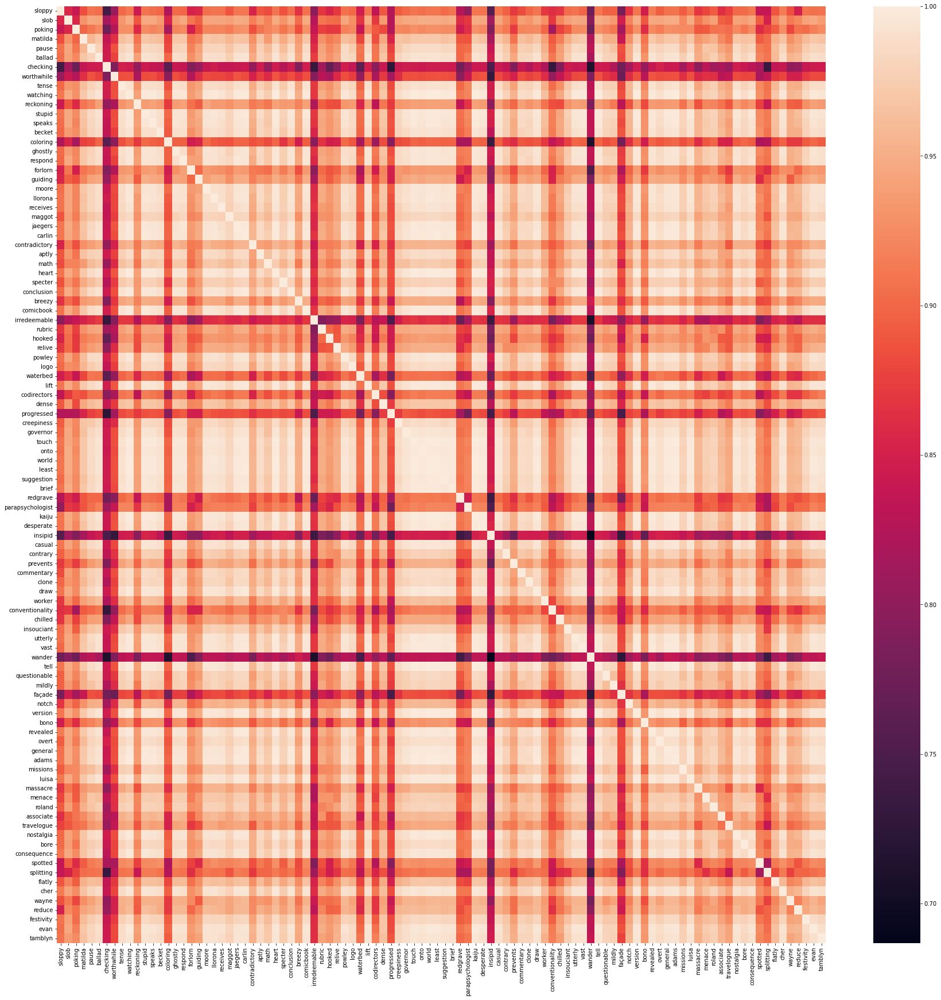

In [82]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 200 Embedding Dimensions

In [83]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 200)

#### Plot word2vec TSNE

In [84]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

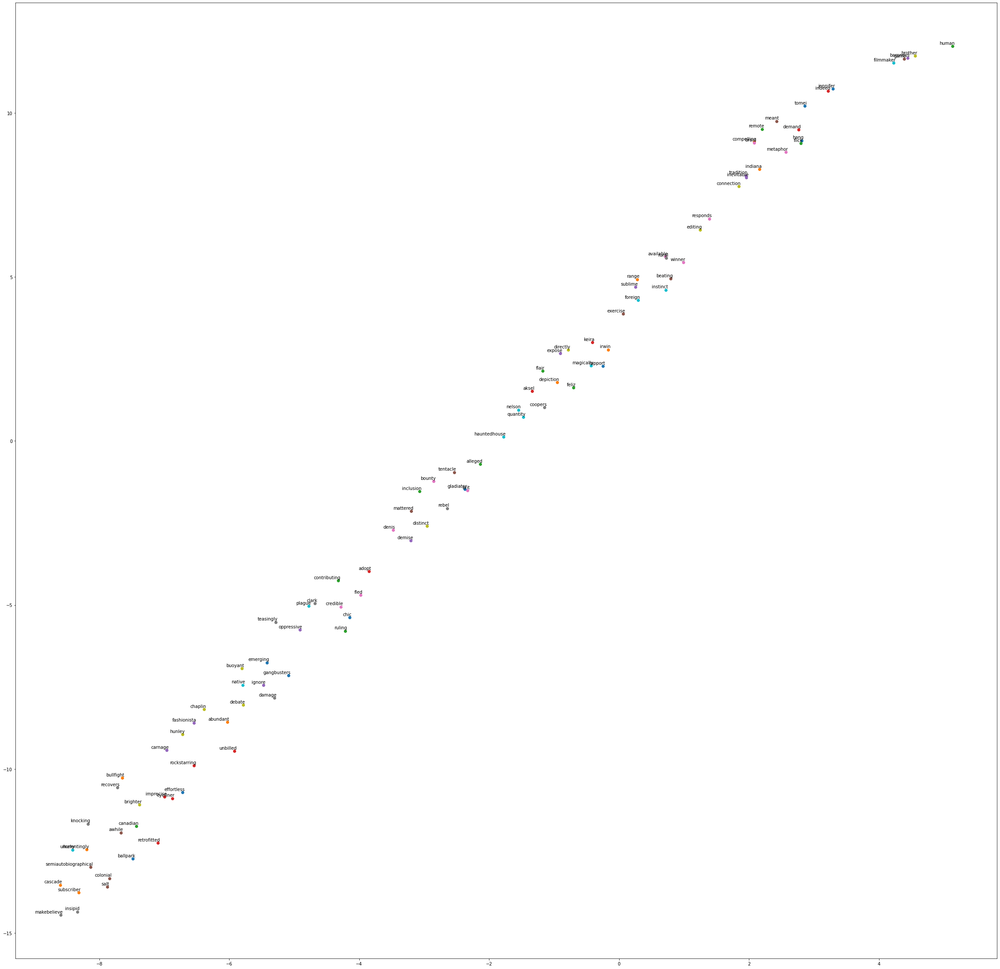

CPU times: user 2.48 s, sys: 169 ms, total: 2.65 s
Wall time: 2.15 s


In [85]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

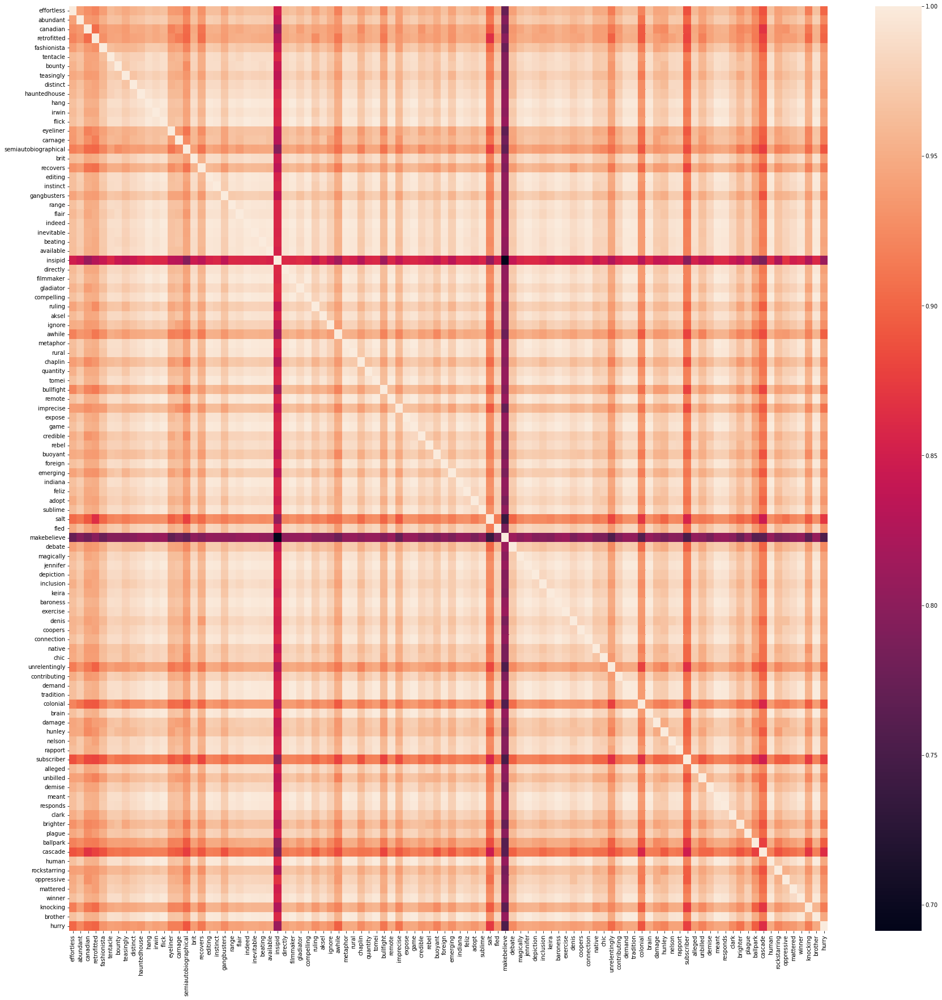

In [86]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 300 Embedding Dimensions

In [87]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 300)

#### Plot word2vec TSNE

In [88]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

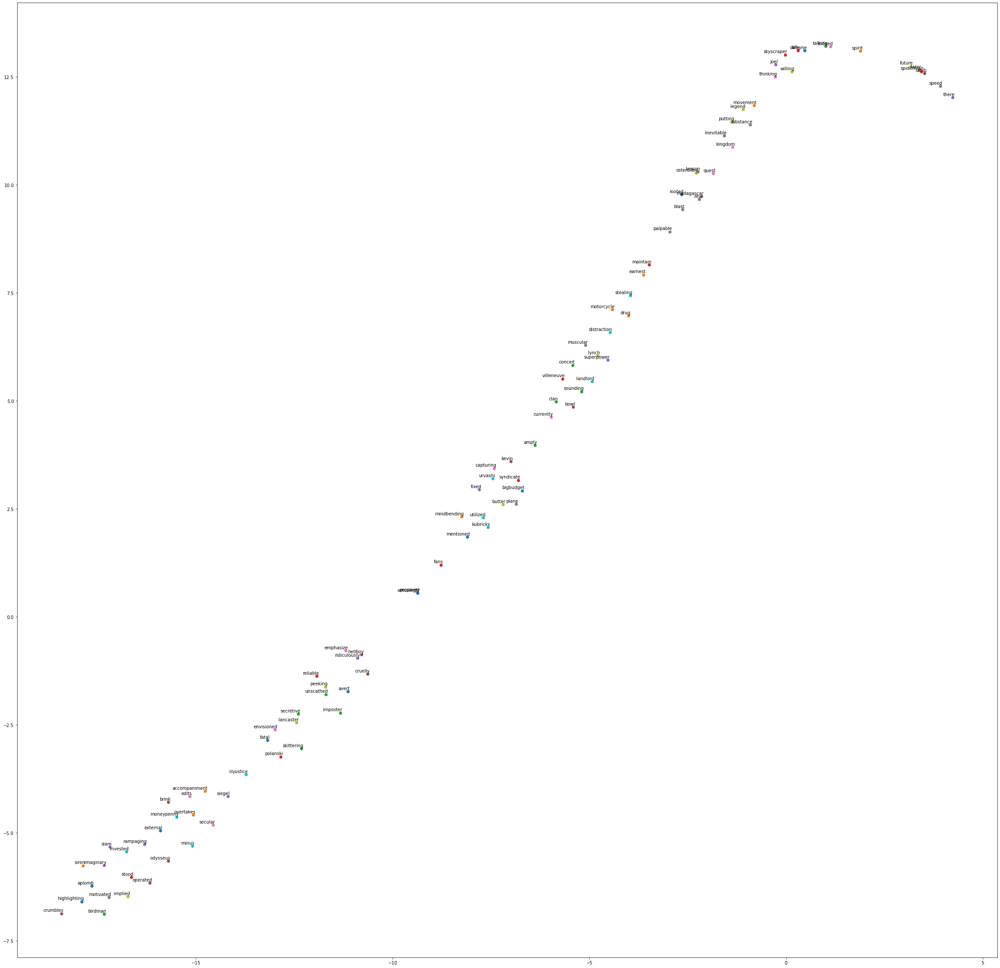

CPU times: user 3.01 s, sys: 185 ms, total: 3.19 s
Wall time: 2.44 s


In [89]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

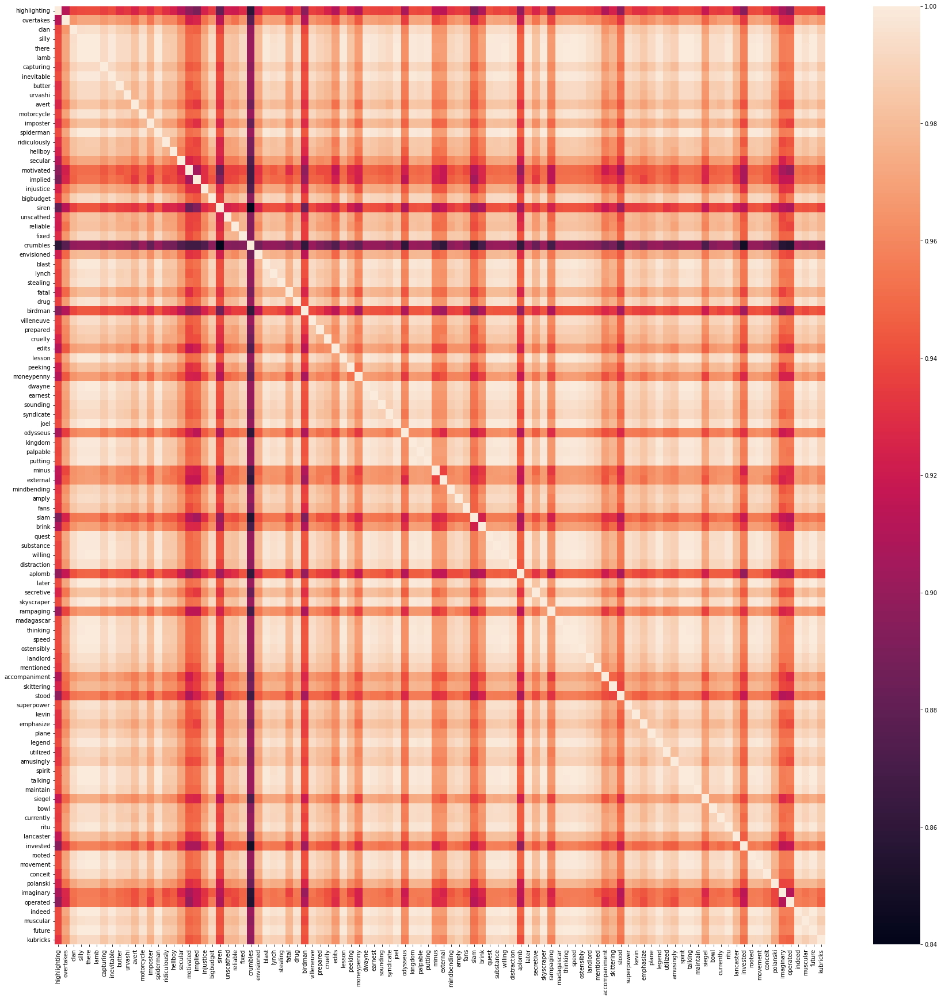

In [90]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

## Documents by Embedding Matrix

### 100 Embedding Dimensions

In [91]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 100)

#### Plot doc2vec TSNE 

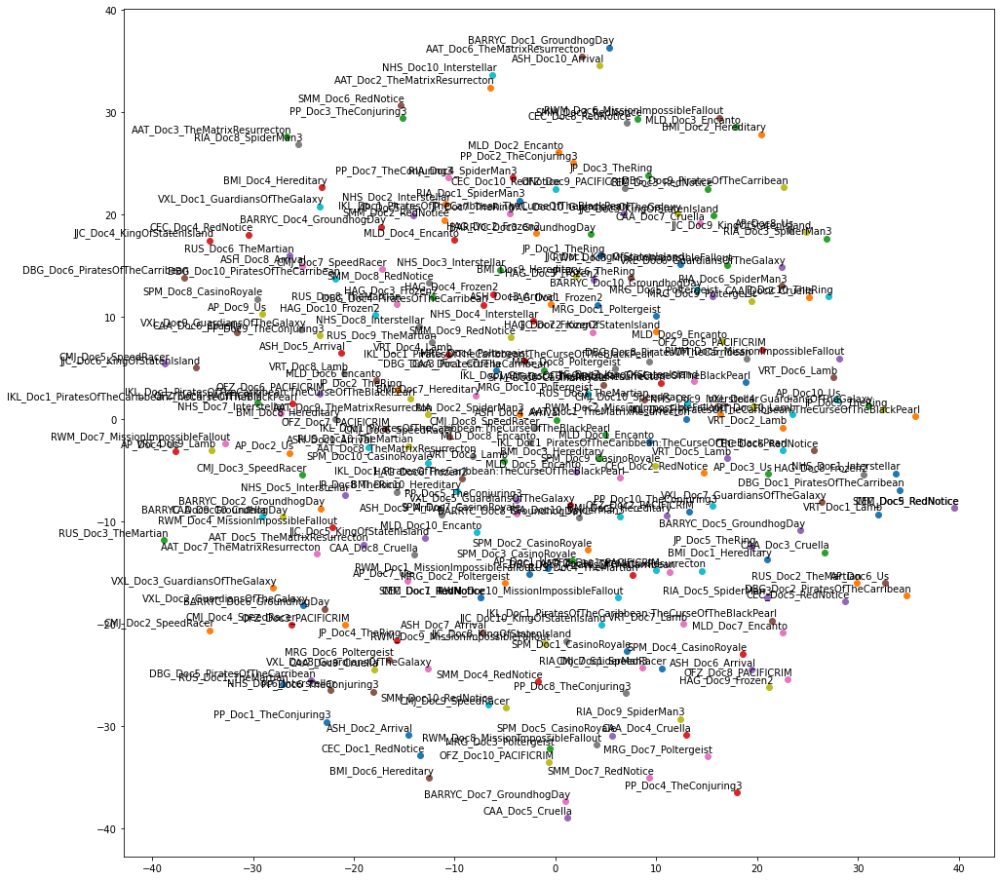

In [92]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [93]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

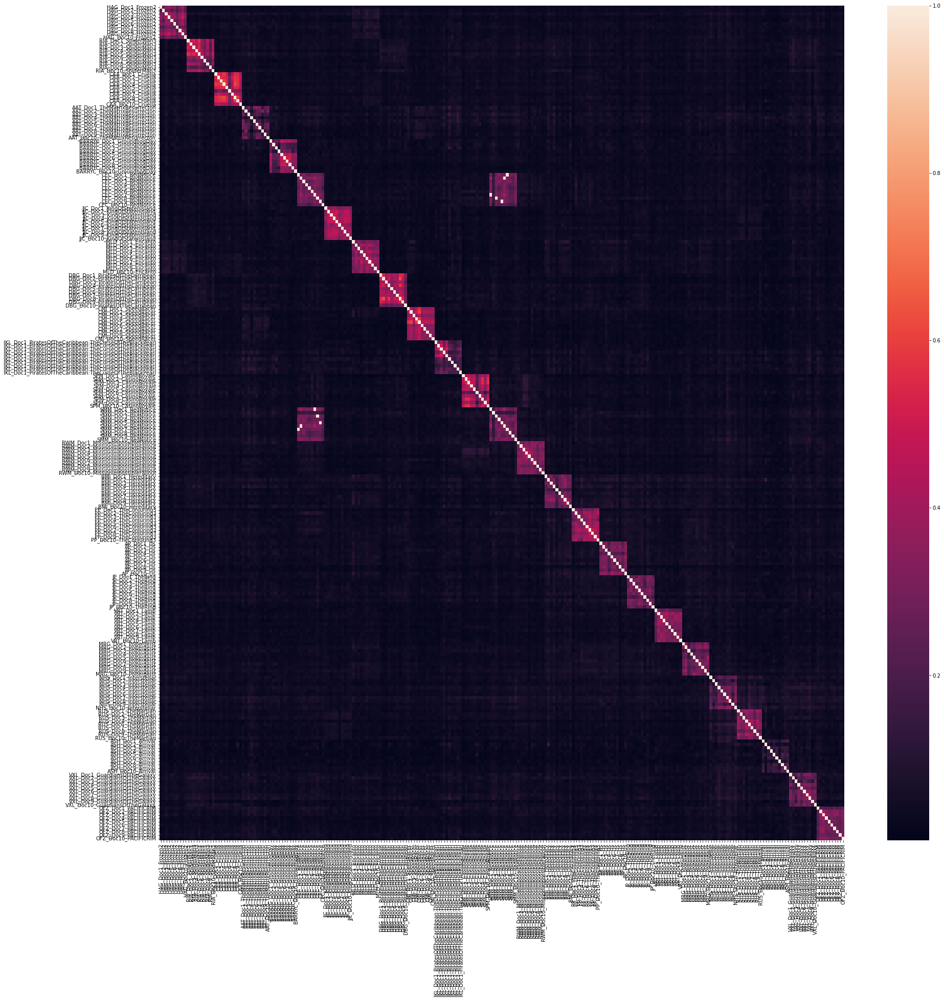

In [94]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 200 Embedding Dimensions

In [95]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 200)

#### Plot doc2vec TSNE 

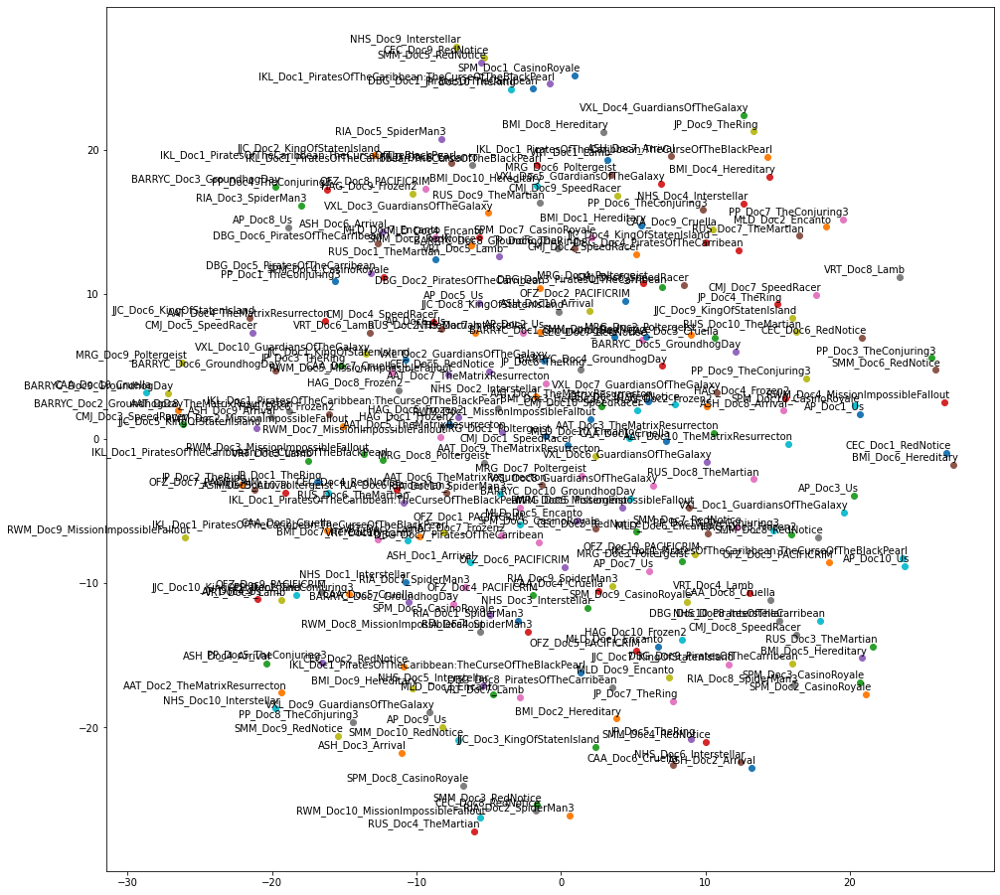

In [96]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [97]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

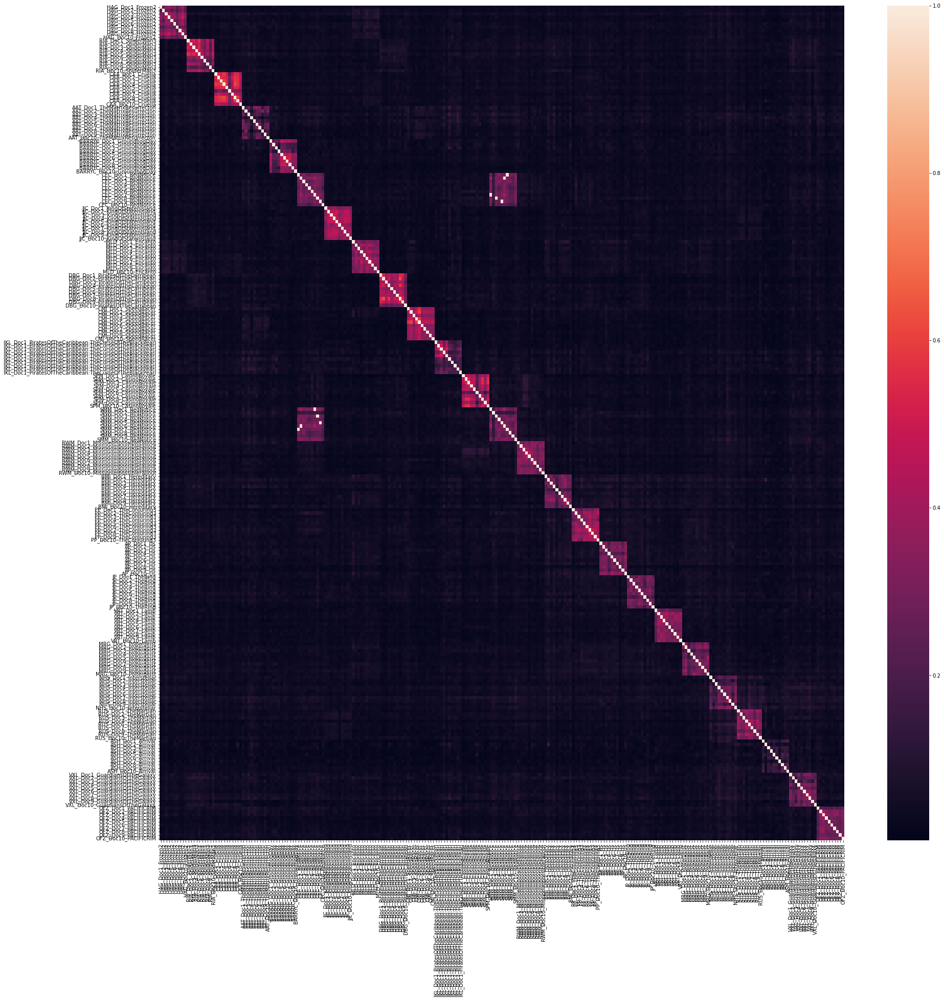

In [98]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 300 Embedding Dimensions

In [99]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 300)

#### Plot doc2vec TSNE 

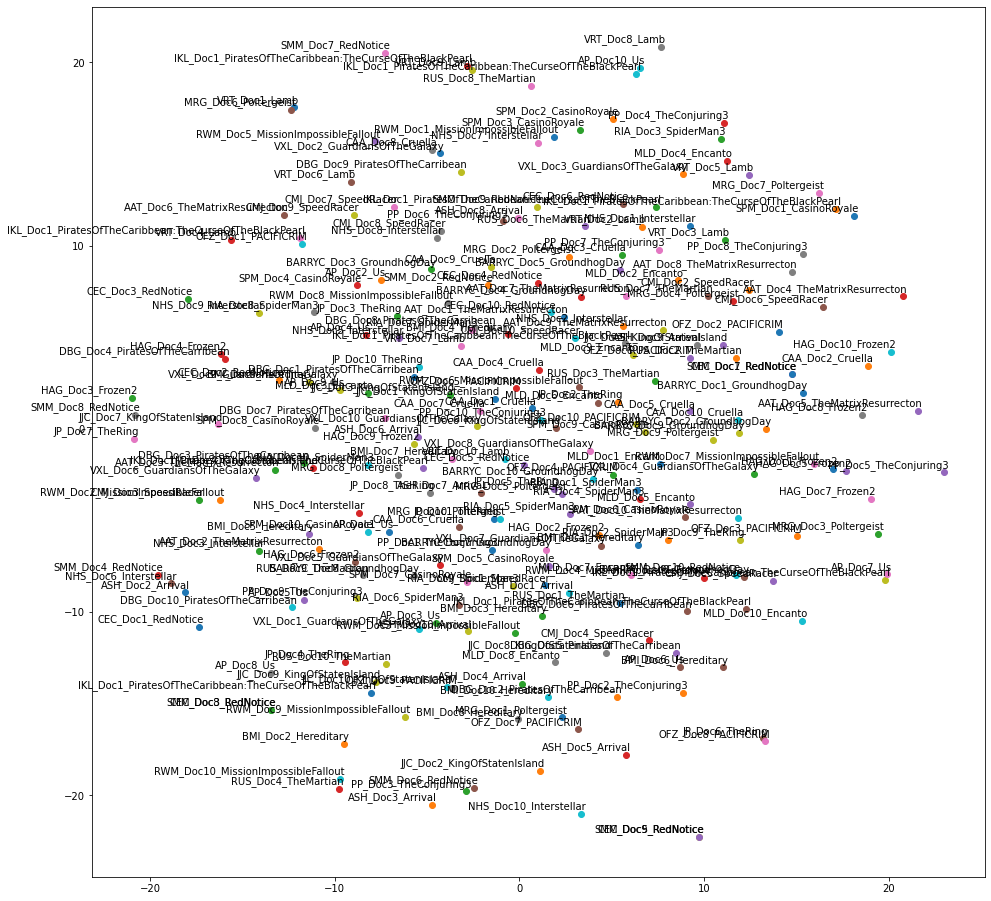

In [100]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [101]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

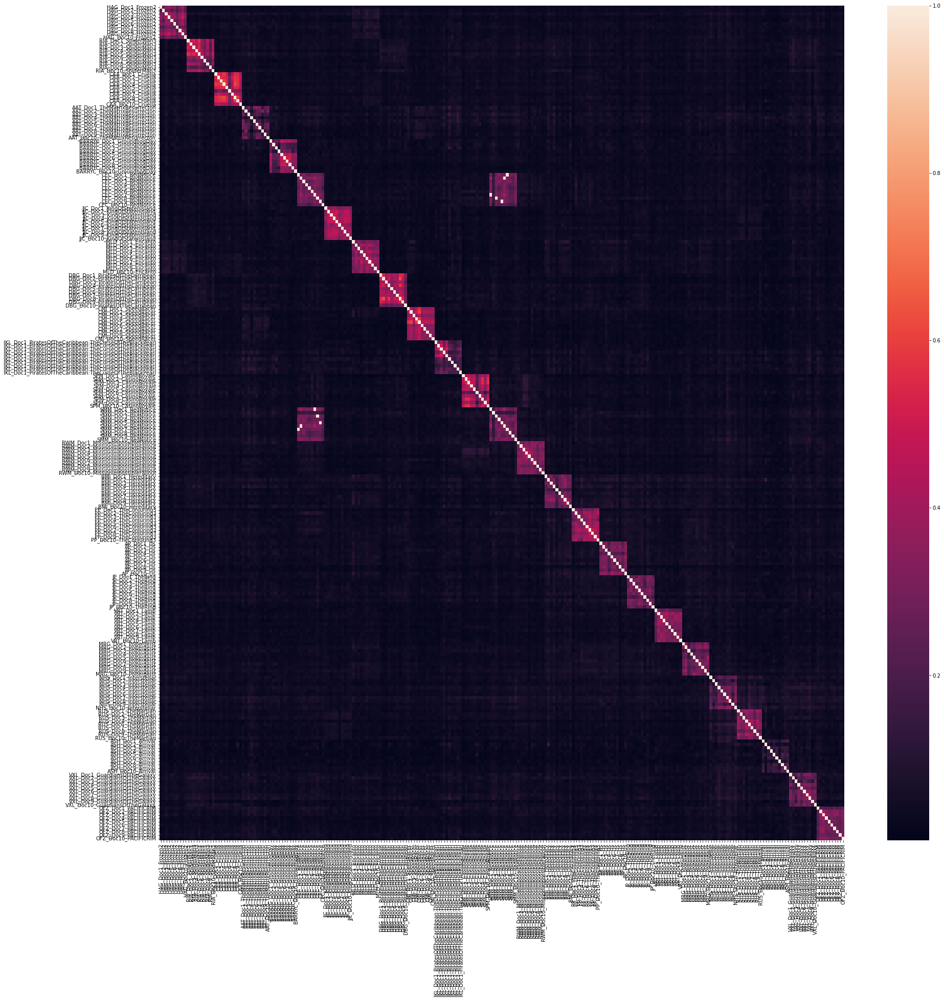

In [102]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);